## ***Setting an Absolute Working Directory***
This code sets up the working directory for your project. It uses the `pathlib` module's `Path` class to define and resolve an absolute path to the "Wyoming_Covid-Data" folder. The `os.chdir()` function then changes the current working directory to that folder, ensuring that any file operations (like reading or writing files) will occur there. Finally, `Path.cwd()` returns the current working directory.

In [80]:
import os
from pathlib import Path

# Setting the working directory
path = Path (r'D:\WY-COVID Data\Wyoming_Covid-Analysis')
path = path.resolve ()
os.chdir (path)
Path.cwd()

WindowsPath('D:/WY-COVID Data/Wyoming_Covid-Analysis')

## ***1. Reading Cummulative Daily COVID-19 Datasets and Converting Them to Absolute Daily Cases for Wyoming (2020–2023)***

This code processes a nationwide COVID-19 dataset to focus on Wyoming. It begins by reading the data with `pd.read_csv()` and filtering for Wyoming records. The dates are reformatted using `pd.to_datetime()` and the data is reshaped from wide to long format with `melt()`. It cleans up county names and creates a spatial GeoDataFrame using `gpd.GeoDataFrame()` combined with `points_from_xy()`. The data is then grouped by county and date using `groupby()`, resampled monthly with `resample()`, and finally saved to CSV files. The processed data is also visualized interactively with the `explore()` method.


In [81]:
import pandas as pd
import geopandas as gpd
import folium
import matplotlib.pyplot as plt
import mapclassify

# Reading COVID cases for the entire USA
covid_data = pd.read_csv('COVID_19_Confirmed_USA.csv')

# Identify metadata columns (non-date columns)
metadata_cols = ['UID', 'iso2', 'iso3', 'code3', 'FIPS', 'Admin2', 
                 'Province_State', 'Country_Region', 'Lat', 'Long_', 'Combined_Key']

# Listing the date columns
date_cols = covid_data.columns[len(metadata_cols):]

# Changing the format of date columns (from '%m/%d/%y' to '%Y-%m-%d')
covid_data.columns = metadata_cols + pd.to_datetime(date_cols, 
                                                    format='%m/%d/%y').strftime('%Y-%m-%d').tolist()

# Converting the wide format to the long format
df_long = covid_data.melt(id_vars=metadata_cols, var_name='Date', value_name='Cases')

# Clean up county names by renaming 'Admin2' to 'County'
df_long = df_long.rename(columns={'Admin2': 'County'})

# Filter daily COVID cases for Wyoming and exclude 'Out of WY' and 'Unassigned' counties
wyoming_daily_Cases = df_long[
    (df_long['Province_State'] == 'Wyoming') &
    (~df_long['County'].isin(['Out of WY', 'Unassigned']))
].copy()  

# Convert the Date column to datetime and sort by County and Date
wyoming_daily_Cases['Date'] = pd.to_datetime(wyoming_daily_Cases['Date'])
wyoming_daily_Cases = wyoming_daily_Cases.sort_values(['County', 'Date'])

# Calculate the daily new cases for each county
wyoming_daily_Cases['daily_cases'] = wyoming_daily_Cases.groupby('County')['Cases'].diff().abs()

# Fill NaN values with 0
wyoming_daily_Cases['daily_cases'] = wyoming_daily_Cases['daily_cases'].fillna(0)

# Convert the DataFrame to a GeoDataFrame using longitude and latitude
wy_daily_gdf = gpd.GeoDataFrame(
    wyoming_daily_Cases,
    geometry=gpd.points_from_xy(wyoming_daily_Cases['Long_'], wyoming_daily_Cases['Lat']),
    crs="EPSG:4326" 
)

# Reproject the GeoDataFrame to EPSG:26912
wy_daily_gdf = wy_daily_gdf.to_crs(epsg=26912)

# Save the result to a CSV file
wy_daily_gdf.to_csv('complete_wy_daily_cases.csv', index=False)

# Save the Processed State wide COVID-19 Datasets to a CSV file
df_long.to_csv('complete_state_wide_covid_cases.csv')

df_long.head ()


,UID,iso2,iso3,code3,FIPS,County,Province_State,Country_Region,Lat,Long_,Combined_Key,Date,Cases
0,84001001,US,USA,840,1001.0,Autauga,Alabama,US,32.539527,-86.644082,"Autauga, Alabama, US",2020-01-22,0
1,84001003,US,USA,840,1003.0,Baldwin,Alabama,US,30.727750,-87.722071,"Baldwin, Alabama, US",2020-01-22,0
2,84001005,US,USA,840,1005.0,Barbour,Alabama,US,31.868263,-85.387129,"Barbour, Alabama, US",2020-01-22,0
3,84001007,US,USA,840,1007.0,Bibb,Alabama,US,32.996421,-87.125115,"Bibb, Alabama, US",2020-01-22,0
4,84001009,US,USA,840,1009.0,Blount,Alabama,US,33.982109,-86.567906,"Blount, Alabama, US",2020-01-22,0


### ***1.1 Normalizing Absolute Daily COVID Cases Couny for the State of Wyoming***

In [82]:
# Reading the total pupulation of the wyoming counties

wy_population = gpd.read_file (r'D:\WY-COVID Data\Wyoming_Covid-Analysis\Shape File\Wyoming_total_population.shp')
wy_population = wy_population.rename(columns={"ttl_ppl":"Total_Population"})

# Changing projected coordinate system
wy_population = wy_population.to_crs(epsg=26912)

# Converting the area into square kilometer
wy_population ['Area_sqkm'] = wy_population.geometry.area/1e6

## Calcualting the population density for the state of Wyoming
wy_population['Pop_Density'] = wy_population['Total_Population']/wy_population['Area_sqkm']

# Clean county names
wy_population["NAME"] = wy_population["NAME"].str.replace(r" County|, Wyoming", "", regex=True)

## Rename the column from "NAME" to "County"
wy_population = wy_population.rename(columns={"NAME": "County"})

### ***1.2 Spatial Join for Absolute Daily COVID Cases for the State of Wyoming***

In [83]:
# Spatial Join
wy_daily_merged = gpd.sjoin(wy_daily_gdf, wy_population, how = "left", predicate='within')

# Normalizing the total COVID cases per 10000 people
wy_daily_merged['Cases_ratio_per_10k'] = (wy_daily_merged['daily_cases'] / wy_daily_merged['Total_Population'])*10000

# Normalize the Total COVID cases by Population Density
wy_daily_merged['Cases_per_km2'] = wy_daily_merged['daily_cases'] /wy_daily_merged ['Pop_Density']

# Rename the column from "NAME" to "County"
wy_daily_merged = wy_daily_merged.rename(columns={"County_left": "County"})

# Ensure the DataFrame is sorted by date within each county group
wy_daily_merged = wy_daily_merged.sort_values(['County', 'Date'])

# wy_daily_merged.to_csv('wy_Absolute_Normalized_COVID_Cases.csv', index = False)


### ***1.2.1 Applying Gussian Smoothing to the Datasets***

In [84]:
import pandas as pd
from scipy.ndimage import gaussian_filter1d

# Define parameters
sigma = 2.0
truncate = 7
column_name = 'Cases_ratio_per_10k'

# Ensure data is sorted by County and Date
wy_daily_merged = wy_daily_merged.sort_values(['County', 'Date']).reset_index(drop=True)

# Define a function to apply Gaussian smoothing per county group
def smooth_group(group):
    smoothed_values = gaussian_filter1d(
        input=group[column_name].values,
        sigma=sigma,
        truncate=truncate / sigma
    )
    group['gauss_smoothed_per_10k'] = smoothed_values
    return group

# Apply smoothing to each county group
wy_daily_merged = wy_daily_merged.groupby('County', group_keys=False).apply(smooth_group)

# Inspect result
wy_daily_merged.to_csv(r'D:\WY-COVID Data\Gaussian Smoothing\Wy Gaussian Data\WY_gaussian_smoothened_data.csv')

C:\Users\chenxu.COOLGIS\AppData\Local\Temp\ipykernel_29668\575918399.py:23: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



### ***1.3 Aplying the Moving Average Filter for the State of the Wyoming***

In [ ]:
# # Ensure the DataFrame is sorted by date within each county group
# wy_daily_merged = wy_daily_merged.sort_values(['County', 'Date'])

# # List of columns to apply the moving average filter
# columns_to_smooth = ['Cases_per_km2', 'Cases_ratio']

# # Apply a 7-day moving average filter for each column using a for loop
# for col in columns_to_smooth:
#     new_col = 'smoothed_' + col
#     wy_daily_merged[new_col] = wy_daily_merged.groupby('County')[col].transform(
#         lambda x: x.rolling(window=3, center=True, min_periods=1).mean()
#     )

# # Save the modified DataFrame to a CSV file
# wy_daily_merged.to_csv('new_Smoothened_cases.csv', index=False)

In [9]:
wy_daily_merged

,UID,iso2,iso3,code3,FIPS,County,Province_State,Country_Region,Lat,Long_,...,County_right,Total_Population,Area_sqm,Area_sqkm,Pop_Density,Cases_ratio,Cases_per_km2,smoothed,smoothed_Cases_per_km2,smoothed_Cases_ratio
0,84056001,US,USA,840,56001.0,Albany,Wyoming,US,41.654987,-105.723541,...,Albany,37525.0,1.120446e+10,11204.462231,3.349112,0.0,0.0,0.000000,0.0,0.0
1,84056001,US,USA,840,56001.0,Albany,Wyoming,US,41.654987,-105.723541,...,Albany,37525.0,1.120446e+10,11204.462231,3.349112,0.0,0.0,0.000000,0.0,0.0
2,84056001,US,USA,840,56001.0,Albany,Wyoming,US,41.654987,-105.723541,...,Albany,37525.0,1.120446e+10,11204.462231,3.349112,0.0,0.0,0.000000,0.0,0.0
3,84056001,US,USA,840,56001.0,Albany,Wyoming,US,41.654987,-105.723541,...,Albany,37525.0,1.120446e+10,11204.462231,3.349112,0.0,0.0,0.000000,0.0,0.0
4,84056001,US,USA,840,56001.0,Albany,Wyoming,US,41.654987,-105.723541,...,Albany,37525.0,1.120446e+10,11204.462231,3.349112,0.0,0.0,0.000000,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26284,84056045,US,USA,840,56045.0,Weston,Wyoming,US,43.839612,-104.567488,...,Weston,6870.0,6.249410e+09,6249.409968,1.099304,0.0,0.0,0.025518,0.0,0.0
26285,84056045,US,USA,840,56045.0,Weston,Wyoming,US,43.839612,-104.567488,...,Weston,6870.0,6.249410e+09,6249.409968,1.099304,0.0,0.0,0.006452,0.0,0.0
26286,84056045,US,USA,840,56045.0,Weston,Wyoming,US,43.839612,-104.567488,...,Weston,6870.0,6.249410e+09,6249.409968,1.099304,0.0,0.0,0.001270,0.0,0.0
26287,84056045,US,USA,840,56045.0,Weston,Wyoming,US,43.839612,-104.567488,...,Weston,6870.0,6.249410e+09,6249.409968,1.099304,0.0,0.0,0.000000,0.0,0.0


### ***Filtering Datasets by Different Season of the Year***

In [85]:
import os
import pandas as pd

# Load & parse dates
df = pd.read_csv(
    r"D:\WY-COVID Data\Gaussian Smoothing\WY Gaussian Data\WY_gaussian_smoothened_data.csv",
    parse_dates=["Date"]
)

# Corrected helper function to assign Season_Year properly
def get_season_year(row):
    m = row["Date"].month
    y = row["Date"].year
    if m == 12:
        return "Winter_" + str(y + 1)
    if m in (1, 2):
        return "Winter_" + str(y)
    if m in (3, 4, 5):
        return "Spring_" + str(y)
    if m in (6, 7, 8):
        return "Summer_" + str(y)
    return "Fall_" + str(y)

# Apply season-year tagging
df["Season_Year"] = df.apply(get_season_year, axis=1)

# Extract season name from Season_Year (if needed for folders or analysis)
df["Season"] = df["Season_Year"].str.split("_").str[0]
df["Year"]   = df["Season_Year"].str.split("_").str[1]

# Base output directory
base_out = r"D:\WY-COVID Data\Gaussian Smoothing\WY Gaussian Seasonal Decomposition"

# For each season-year, sort by County then Date and write to CSV
for season_year, season_df in df.groupby("Season_Year"):
    folder_path = os.path.join(base_out, season_year)
    os.makedirs(folder_path, exist_ok=True)

    # Sort the entire season’s data by County, then Date
    sorted_season = season_df.sort_values(["County", "Date"])

    out_file = os.path.join(folder_path, f"{season_year}.csv")
    sorted_season.to_csv(out_file, index=False)

    print(f"Wrote {len(sorted_season)} rows to {out_file}")


Wrote 2093 rows to D:\WY-COVID Data\Gaussian Smoothing\WY Gaussian Seasonal Decomposition\Fall_2020\Fall_2020.csv
Wrote 2093 rows to D:\WY-COVID Data\Gaussian Smoothing\WY Gaussian Seasonal Decomposition\Fall_2021\Fall_2021.csv
Wrote 2093 rows to D:\WY-COVID Data\Gaussian Smoothing\WY Gaussian Seasonal Decomposition\Fall_2022\Fall_2022.csv
Wrote 2116 rows to D:\WY-COVID Data\Gaussian Smoothing\WY Gaussian Seasonal Decomposition\Spring_2020\Spring_2020.csv
Wrote 2116 rows to D:\WY-COVID Data\Gaussian Smoothing\WY Gaussian Seasonal Decomposition\Spring_2021\Spring_2021.csv
Wrote 2116 rows to D:\WY-COVID Data\Gaussian Smoothing\WY Gaussian Seasonal Decomposition\Spring_2022\Spring_2022.csv
Wrote 207 rows to D:\WY-COVID Data\Gaussian Smoothing\WY Gaussian Seasonal Decomposition\Spring_2023\Spring_2023.csv
Wrote 2116 rows to D:\WY-COVID Data\Gaussian Smoothing\WY Gaussian Seasonal Decomposition\Summer_2020\Summer_2020.csv
Wrote 2116 rows to D:\WY-COVID Data\Gaussian Smoothing\WY Gaussian Se

### ***Time Series plots***

C:\Users\chenxu.COOLGIS\AppData\Local\Temp\ipykernel_29668\127714061.py:56: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.85, 0.95])


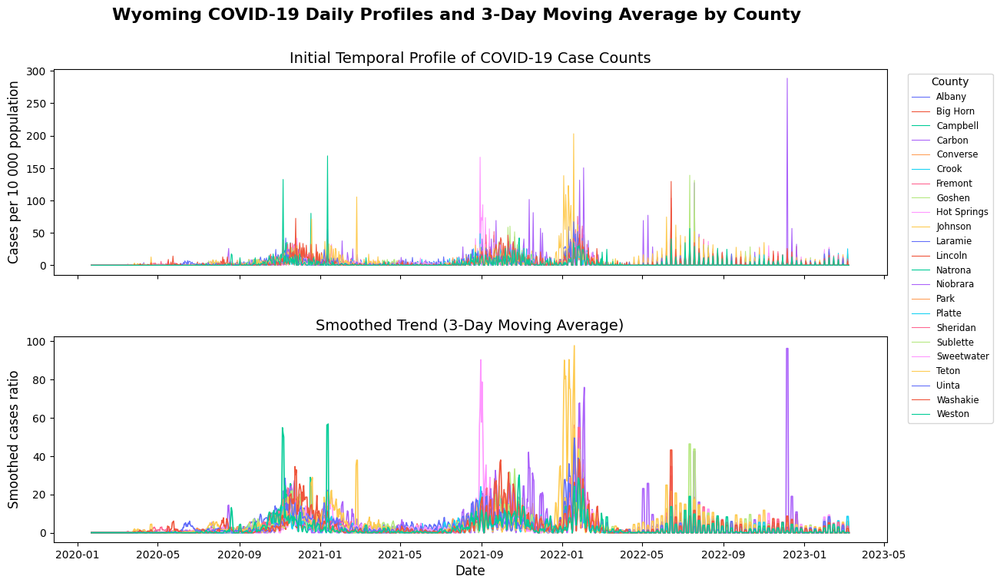

In [11]:
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px

# Prepare & sort
df = wy_daily_merged.copy()
df['Date'] = pd.to_datetime(df['Date'])
df.sort_values(['County','Date'], inplace=True)

# Build the Plotly palette → Matplotlib colour map
counties = df['County'].unique()
palette = px.colors.qualitative.Plotly
color_map = {c: palette[i % len(palette)] for i, c in enumerate(counties)}

# Create the two‐panel figure
fig, (ax1, ax2) = plt.subplots(
    2, 1,
    figsize=(14, 8),
    sharex=True,
    gridspec_kw={'hspace': 0.3}
)

# Plot raw vs. smoothed for each county
for cnty in counties:
    sub = df[df['County']==cnty]
    ax1.plot(
        sub['Date'], sub['Cases_ratio'],
        color=color_map[cnty], lw=0.8, label=cnty
    )
    ax2.plot(
        sub['Date'], sub['smoothed_Cases_ratio'],
        color=color_map[cnty], lw=1.2
    )

# itles & axis labels
fig.suptitle(
    "Wyoming COVID-19 Daily Profiles and 3-Day Moving Average by County",
    fontsize=16, y=0.98, fontweight='bold'
)
ax1.set_title("Initial Temporal Profile of COVID-19 Case Counts", fontsize=14)
ax1.set_ylabel("Cases per 10 000 population", fontsize=12)

ax2.set_title("Smoothed Trend (3-Day Moving Average)", fontsize=14)
ax2.set_ylabel("Smoothed cases ratio", fontsize=12)
ax2.set_xlabel("Date", fontsize=12)

# Single legend on the top panel
ax1.legend(
    bbox_to_anchor=(1.02, 1),
    loc='upper left',
    title="County",
    fontsize='small'
)

# Final layout & export
plt.tight_layout(rect=[0, 0, 0.85, 0.95])
fig.savefig(
    "WY_COVID_CasesRatio_vs_3DayMA.png",
    dpi=300, bbox_inches='tight'
)
plt.show()


## ***Imports. Directories, Common Settings***

In [12]:
%matplotlib inline
import os, math, json
from pathlib import Path

import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

import matplotlib as mpl
import pywt
import pycwt as wave
from scipy.signal import detrend
from statsmodels.stats.multitest import multipletests

# Output folder for all results
OUTDIR = Path(r"D:\WY-COVID Data\Wavelet_Results")
OUTDIR.mkdir(exist_ok=True, parents=True)

# Wavelet parameters
WAVELET_PYWT  = 'morl'              # for PyWavelets CWT
WAVELET_PYCWT = 'morlet'            # for PyCWT significance
DT            = 1.0                 # daily sampling
SCALES        = np.logspace(0, np.log10(128), 100)
PERIODS       = SCALES / pywt.central_frequency(WAVELET_PYWT)
YTICKS        = [14,28,42,56,70,84,98,126]

## ***All Helper Functions***

In [ ]:
def compute_cwt(series, scales=SCALES, wavelet=WAVELET_PYWT):
    """PyWavelets CWT → coeffs & power."""
    coeffs, _ = pywt.cwt(series, scales, wavelet)
    return coeffs, np.abs(coeffs)**2

def global_wavelet_spectrum(power, scales=SCALES, dt=DT):
    """Torrence & Compo 1998 GWS."""
    return (power.sum(axis=1)*dt)/scales

def estimate_lag1(series):
    """Biased lag-1 autocorrelation estimator."""
    x = series - np.nanmean(series)
    x = x[~np.isnan(x)]
    if x.size < 2:
        return 0.0
    # corrcoef returns 
    return np.corrcoef(x[:-1], x[1:])[0,1]

def red_noise_significance(series, dt=DT, scales=SCALES,
                           sig_level=0.95, wavelet=WAVELET_PYCWT):
    """
    Global χ² red-noise significance.
    Falls back to a simple lag-1 if pycwt.ar1 raises Warning.
    """
    try:
        lag1 = wave.ar1(series)[0]
    except Warning:
        lag1 = estimate_lag1(series)

    signif, _ = wave.significance(
        1.0,        # normalized variance
        dt,
        scales,
        0,          # σ_test=0 → global χ²
        lag1,       # AR(1) coefficient
        sig_level,  # e.g. 0.95
        2,          # DOF = 2 for χ²(2)
        wavelet
    )
    return signif, lag1


def ridge_extract(power):
    """Index of max power along scales for each time point."""
    return power.argmax(axis=0)

def phase_amp(coeffs, ridge_idx):
    amp   = np.abs(coeffs[ridge_idx, np.arange(coeffs.shape[1])])
    phase = np.angle(coeffs[ridge_idx, np.arange(coeffs.shape[1])])
    return amp, phase

def fdr_correction(pvals, alpha=0.05):
    """Benjamini–Hochberg FDR."""
    _, qvals, _, _ = multipletests(pvals, alpha=alpha, method='fdr_bh')
    return qvals

def plot_scalogram(ax, tnum, periods, power, mask, title, show_ticks=True):
    """
       This function creates a filled-contour scalogram and adds a grey contour to highlight significant areas.
       The plot has a white background. If you set show_ticks to False, the x and y axis ticks and labels will not appear.
       The function returns the ContourSet, which you can use to add a colorbar.
    """
    # white background
    ax.set_facecolor('white')
    ax.figure.patch.set_facecolor('white')

    # plasma cmap with NaNs → white
    cmap = mpl.colormaps['plasma'].with_extremes(bad='white')

    # filled contour
    levels = np.linspace(np.nanmin(power), np.nanmax(power), 60)
    cf = ax.contourf(
        tnum, periods, np.ma.masked_invalid(power),
        levels=levels, cmap=cmap, extend='both'
    )

    # significance contour
    ax.contour(
        tnum, periods, mask.astype(int),
        levels=[0.5], colors='grey', linewidths=0.75
    )

    # log-y, invert so long periods appear at bottom
    ax.set_yscale('log')
    ax.invert_yaxis()
    ax.set_title(title, pad=6)

    if show_ticks:
        ax.set_yticks(YTICKS)
        ax.set_ylabel("Period (days)")
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
        ax.tick_params(axis='x', rotation=45, labelsize='small')
    else:
        ax.set_xticks([])
        ax.set_yticks([])

    return cf

def save_meta(path, omega0, scales=SCALES, dt=DT, lag1=0):
    meta = {
        "wavelet": "Morlet",
        "omega0": omega0,
        "dt_days": dt,
        "n_scales": len(scales),
        "scale_min": float(scales.min()),
        "scale_max": float(scales.max()),
        "ar1_lag1": lag1
    }
    json.dump(meta, open(path, 'w'), indent=2)


## ***Waavelet Loop, figures + CSV outputs***

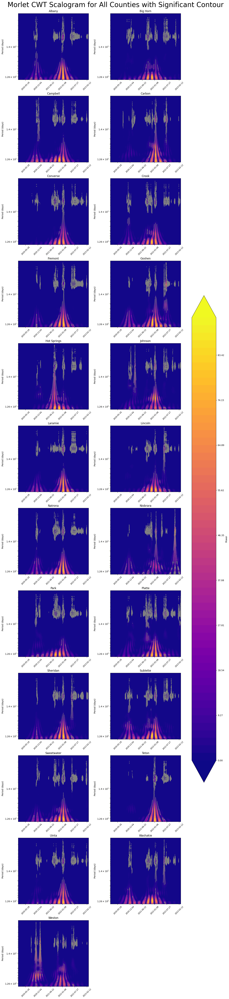

All outputs written to D:\WY-COVID Data\Wavelet_Results


In [ ]:
counties = wy_daily_merged['County'].unique()
all_pvals = []

# Set up the plot grid (4 rows, dynamic columns) 
nrows = 13
ncols = math.ceil(len(counties) / nrows)
fig, axes = plt.subplots(nrows, ncols,
                         figsize=(7 * ncols, 5 * nrows),
                         constrained_layout=True,
                         squeeze=False)
axes = axes.flatten()

for i, county in enumerate(counties):
    sub = wy_daily_merged[wy_daily_merged['County'] == county]
    # detrend & standardize
    sig = detrend(sub['smoothed_Cases_ratio'].values)
    sig = (sig - sig.mean()) / sig.std()
    
    coeffs, power    = compute_cwt(sig)
    signif95, lag1   = red_noise_significance(sig)
    mask             = power >= signif95[:, None]
    all_pvals.extend((power / signif95[:, None]).flatten())
    
    ridge_idx        = ridge_extract(power * mask)
    amp, phase       = phase_amp(coeffs, ridge_idx)
    
    tnum             = mdates.date2num(sub['Date'])
    
    # plot scalogram + significance
    ax = axes[i]
    im = plot_scalogram(ax, tnum, PERIODS, power, mask, county)
    
    # save GWS CSV
    gws = global_wavelet_spectrum(power)
    pd.DataFrame({
        'period_days': PERIODS,
        'gws_power':   gws,
        'sig95':       signif95
    }).to_csv(OUTDIR / f"gws_{county}.csv", index=False)
    
    # save ridge CSV
    pd.DataFrame({
        'date':       sub['Date'],
        'period':     PERIODS[ridge_idx],
        'amplitude':  amp,
        'phase_rad':  phase
    }).to_csv(OUTDIR / f"ridge_{county}.csv", index=False)

# remove any extra axes
for ax in axes[len(counties):]:
    fig.delaxes(ax)

fig.suptitle("Morlet CWT Scalogram for All Counties with Significant Contour",
             fontsize=30)
cbar = fig.colorbar(im, ax=axes.tolist(), shrink=0.6)
cbar.set_label("Power")
fig.savefig(OUTDIR / "scalogram_all_counties.png", dpi=300)
plt.show()

# Step 1.3 – FDR correction
all_p = np.array(all_pvals)
qvals = fdr_correction(all_p)
pd.DataFrame({'p_value': all_p, 'q_value': qvals}).to_csv(
    OUTDIR / "fdr_table.csv", index=False)

# Step 1.5 – save methods metadata
save_meta(OUTDIR / "wavelet_meta.json",
          omega0=pywt.central_frequency(WAVELET_PYWT),
          lag1=lag1)

print("All outputs written to", OUTDIR)

# export a vector PDF
out_pdf = r'D:\WY-COVID Data\Moving Average 30 Days\Scalogram_with_Significant_Contour_Plots.pdf'
fig.savefig(out_pdf,
            format='pdf',
            bbox_inches='tight')


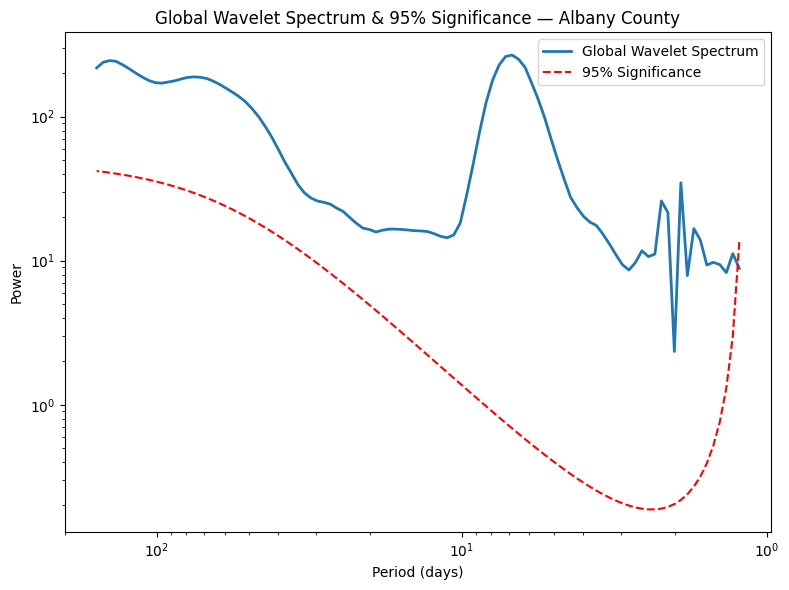

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

# directory
GWS_DIR = Path(r"D:\WY-COVID Data\Wavelet_Results")

# Load Albany’s spectrum
albany_csv = GWS_DIR / "gws_Albany.csv"
df = pd.read_csv(albany_csv)

# Plot
fig, ax = plt.subplots(figsize=(8, 6))

ax.loglog(df['period_days'], df['gws_power'],
          label='Global Wavelet Spectrum', linewidth=2)
ax.loglog(df['period_days'], df['sig95'],
          linestyle='--', color='red', label='95% Significance')

ax.invert_xaxis()
ax.set_title('Global Wavelet Spectrum & 95% Significance — Albany County')
ax.set_xlabel('Period (days)')
ax.set_ylabel('Power')
ax.legend()
fig.tight_layout()

# Show & save
plt.show()

# save to PDF/PNG
out_pdf = GWS_DIR / "GWS_Albany.pdf"
out_png = GWS_DIR / "GWS_Albany.png"
fig.savefig(out_pdf, format='pdf', bbox_inches='tight')
fig.savefig(out_png, dpi=300, bbox_inches='tight')


## ***Plotting the Global Wavelet Spectral***

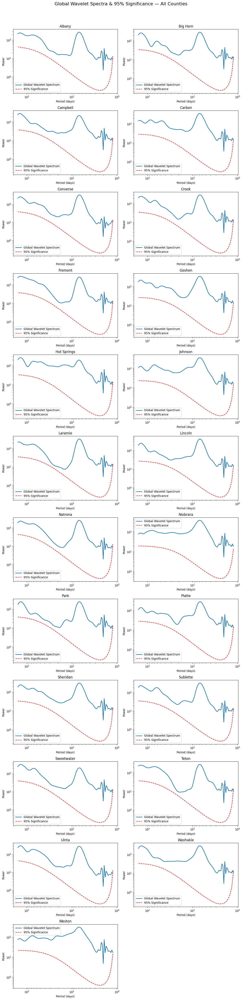

In [ ]:
import math
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

# Directory
GWS_DIR = Path(r"D:\WY-COVID Data\Wavelet_Results")

# Gather all the county files
files = sorted(GWS_DIR.glob("gws_*.csv"))
n = len(files)
if n == 0:
    raise ValueError("No county files found in GWS_DIR")

# Determine grid size: 2 columns, ceil(n/2) rows
ncols = 2
nrows = math.ceil(n / ncols)

# Create the subplot grid
fig, axes = plt.subplots(nrows=nrows, ncols=ncols,
                         figsize=(6*ncols, 4*nrows),
                         sharex=False, sharey=False)
axes = axes.flatten()

# Plot each county
for ax, path in zip(axes, files):
    county = path.stem.replace("gws_", "")
    df = pd.read_csv(path)
    
    ax.loglog(df['period_days'], df['gws_power'],
              label='Global Wavelet Spectrum', linewidth=2)
    ax.loglog(df['period_days'], df['sig95'],
              linestyle='--', color='red', label='95% Significance')
    ax.invert_xaxis()
    ax.set_title(county)
    ax.set_xlabel('Period (days)')
    ax.set_ylabel('Power')
    ax.legend()

for ax in axes[len(files):]:
    ax.axis('off')

# Layout adjustments
fig.tight_layout()
fig.suptitle('Global Wavelet Spectra & 95% Significance — All Counties',
             fontsize=16, y=1.02)
plt.show()

# export a vector PDF
out_pdf = r'D:\WY-COVID Data\Moving Average 30 Days\Global_Wavelet_Spectra(GWS).pdf'
fig.savefig(out_pdf,
            format='pdf',
            bbox_inches='tight')

## ***2.1 Autocorrelation Function Analysis for the Cases Ratio (Popualtion) for Albany County***

<Figure size 1000x500 with 0 Axes>

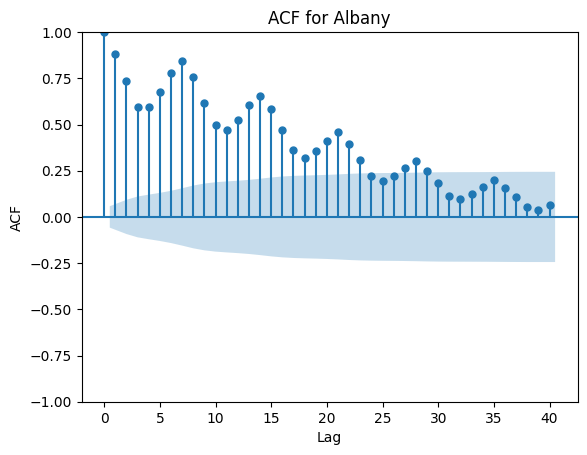

In [ ]:
from statsmodels.tsa.stattools import acf
from statsmodels.graphics.tsaplots import plot_acf
import matplotlib.pyplot as plt

# Group the DataFrame by 'County'
grouped = wy_daily_merged.groupby('County')

# List to hold ACF results for all counties
acf_results = []

# Iterate over each county group
for county_name, county_data in grouped:
    # Extract the smoothed cases and drop any remaining NaNs
    series = county_data['smoothed_Cases_ratio'].dropna()
    
    # Compute ACF 
    acf_values = acf(series, nlags=40, fft=False)
    
    # Create a DataFrame for this county's ACF results
    county_acf = pd.DataFrame({
        'County': county_name,
        'Lag': range(len(acf_values)),
        'ACF': acf_values
    })
    
    acf_results.append(county_acf)

# Combine all ACF results into a single DataFrame
acf_df = pd.concat(acf_results, ignore_index=True)
# acf_df.to_csv('final_smoothened.csv')

# Plot ACF for the first county
county_name = acf_df['County'].unique()[0]
county_series = wy_daily_merged[wy_daily_merged['County'] == county_name]['smoothed_Cases_ratio'].dropna()

plt.figure(figsize=(10, 5))
plot_acf(county_series, lags=40, alpha=0.05, title=f'ACF for {county_name}')
plt.xlabel('Lag')
plt.ylabel ('ACF')
plt.show()

### ***Continuous Wavelet Transform (CWT) for Albany County (Scalogram)***

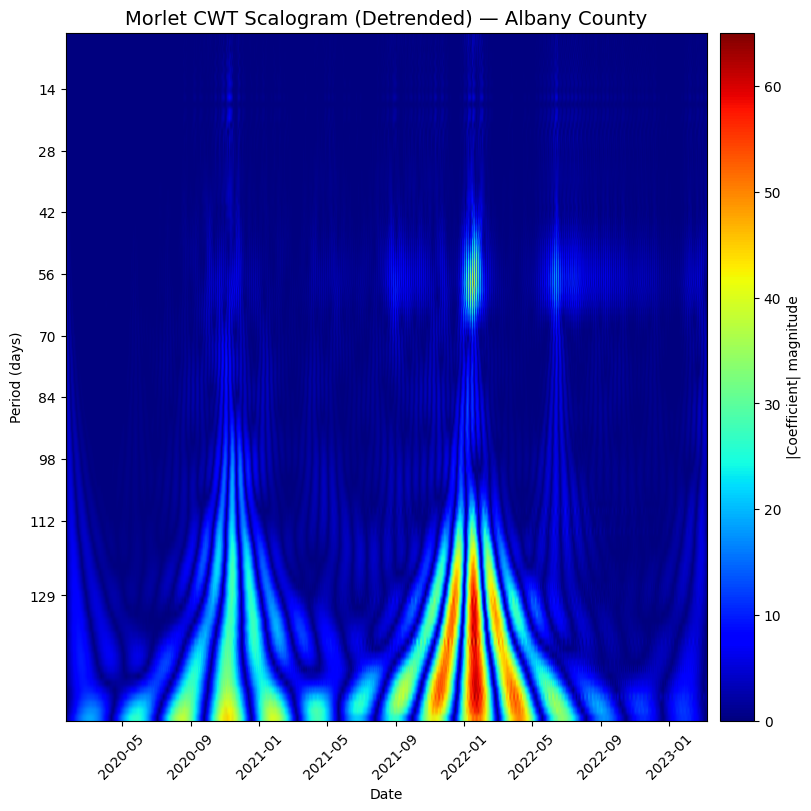

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pywt
import matplotlib.dates as mdates
from scipy.signal import detrend

# specified parameters 
wavelet_name = 'morl'            
omega0       = 0.8125            
dt_days      = 1.0               
n_scales     = 100
scale_min    = 1.0
scale_max    = 127.99999999999999

# Data & Wavelet Setup 
albany_df    = wy_daily_merged[wy_daily_merged['County'] == 'Albany'].copy()

# Build the scales & periods from your parameters
scales       = np.logspace(np.log10(scale_min), np.log10(scale_max), num=n_scales)
central_freq = pywt.central_frequency(wavelet_name)
periods      = scales / central_freq

# Y‐ticks and colormap
yticks = [14, 28, 42, 56, 70, 84, 98, 112, 129]
cmap   = 'jet'

#  Preprocess Albany signal
signal_raw = albany_df['smoothed_Cases_ratio'].values
signal_dt  = detrend(signal_raw) - np.mean(signal_raw)
dates      = pd.to_datetime(albany_df['Date'])
time_num   = mdates.date2num(dates)

# Compute CWT (with dt_days as sampling_period)
coeffs, _ = pywt.cwt(
    signal_dt,
    scales,
    wavelet_name,
    sampling_period=dt_days
)

# Plot
fig, ax = plt.subplots(figsize=(8, 8), constrained_layout=True)

im = ax.imshow(
    np.abs(coeffs),
    extent=[time_num.min(), time_num.max(), periods.min(), periods.max()],
    origin='lower',
    cmap=cmap,
    aspect='auto'
)

# Titles & labels
ax.set_title('Morlet CWT Scalogram (Detrended) — Albany County', fontsize=14)
ax.set_xlabel('Date')
ax.set_ylabel('Period (days)')

# Axis formatting
ax.xaxis_date()
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.setp(ax.get_xticklabels(), rotation=45)
ax.set_yticks(yticks)
ax.invert_yaxis()

# Colorbar
cbar = fig.colorbar(im, ax=ax, pad=0.02)
cbar.set_label('|Coefficient| magnitude')

# Save outputs
fig.savefig(r'D:\WY-COVID Data\scalogram_Albany.png', dpi=300, bbox_inches='tight')
fig.savefig(r'D:\WY-COVID Data\scalogram_Albany.pdf', format='pdf', bbox_inches='tight')

plt.show()


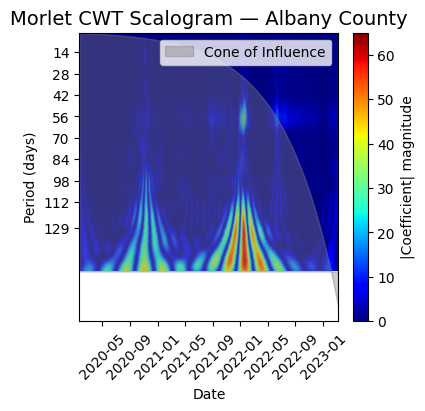

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pywt
import matplotlib.dates as mdates
from scipy.signal import detrend
from scipy.interpolate import interp1d

# Data & Wavelet Setup
albany_df    = wy_daily_merged[wy_daily_merged['County'] == 'Albany'].copy()
wavelet      = 'morl'
omega0       = 6.0  # Morlet default
central_freq = pywt.central_frequency(wavelet)
scales       = np.logspace(np.log10(1), np.log10(128), num=100)
periods      = scales / central_freq
dt           = 1.0  # daily sampling

# Y-ticks and colormap
yticks = [14, 28, 42, 56, 70, 84, 98, 112, 129]
cmap   = 'jet'

# --- Preprocess Albany signal ---
signal_raw = albany_df['smoothed_Cases_ratio'].values
signal_dt  = detrend(signal_raw) - np.mean(signal_raw)
dates      = pd.to_datetime(albany_df['Date'])
time_num   = mdates.date2num(dates)
N          = len(signal_dt)
t_min, t_max = time_num.min(), time_num.max()

# Compute CWT
coeffs, _ = pywt.cwt(signal_dt, scales, wavelet)

# Approximate Cone of Influence (COI)
coi = np.sqrt(2) * scales  # in days
# Interpolate to match length of time_num (1143 points)
coi_interp = interp1d(
    np.linspace(t_min, t_max, len(coi)),
    coi,
    bounds_error=False,
    fill_value=periods.max()
)
coi_curve_upper = coi_interp(time_num)

# Plot
fig, ax = plt.subplots(figsize=(4, 4), constrained_layout=True)

# Wavelet power magnitude
im = ax.imshow(
    np.abs(coeffs),
    extent=[t_min, t_max, periods.min(), periods.max()],
    origin='lower',
    cmap=cmap,
    aspect='auto'
)

# COI overlay (gray fill)
ax.fill_between(
    time_num,
    coi_curve_upper,
    y2=periods.max(),
    color='gray',
    alpha=0.4,
    label='Cone of Influence'
)

# Labels, ticks, layout
ax.set_title('Morlet CWT Scalogram — Albany County', fontsize=14)
ax.set_xlabel('Date')
ax.set_ylabel('Period (days)')
ax.xaxis_date()
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.setp(ax.get_xticklabels(), rotation=45)
ax.set_yticks(yticks)
ax.invert_yaxis()
ax.legend(loc='upper right')

# Colorbar
cbar = fig.colorbar(im, ax=ax, pad=0.02)
cbar.set_label('|Coefficient| magnitude')

# Save 
fig.savefig(r'D:\WY-COVID Data\scalogram_Albany_with_COI.png', dpi=300, bbox_inches='tight')
fig.savefig(r'D:\WY-COVID Data\scalogram_Albany_with_COI.pdf', format='pdf', bbox_inches='tight')
plt.show()


In [20]:
wy_daily_merged.columns

Index(['UID', 'iso2', 'iso3', 'code3', 'FIPS', 'County', 'Province_State',
       'Country_Region', 'Lat', 'Long_', 'Combined_Key', 'Date', 'Cases',
       'daily_cases', 'geometry', 'index_right', 'GEOID', 'County_right',
       'Total_Population', 'Area_sqm', 'Area_sqkm', 'Pop_Density',
       'Cases_ratio', 'Cases_per_km2', 'smoothed', 'smoothed_Cases_per_km2',
       'smoothed_Cases_ratio'],
      dtype='object')

### ***2.1 Continuous Wavelet Transform (CWT)***

### ***Static***

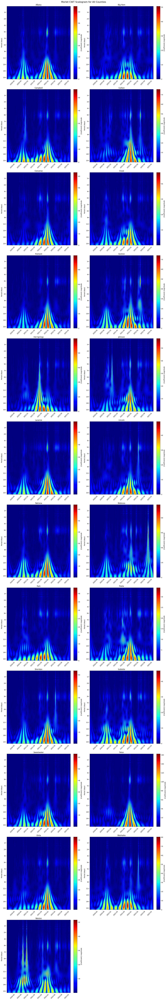

In [ ]:
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import pywt
import matplotlib.dates as mdates
from scipy.signal import detrend
import math

# Wavelet & Scale/Period Setup (shared)
wavelet = 'morl'
central_freq = pywt.central_frequency(wavelet)
scales = np.logspace(np.log10(1), np.log10(128), num=100)
periods = scales / central_freq

# Y-ticks (days) and colormap
yticks = [14, 28, 42, 56, 70, 84, 98, 112, 126, 140, 154]
cmap = 'jet'

# Prepare subplot grid with constrained_layout turned on
counties = wy_daily_merged['County'].unique()
n_cols = 2
n_rows = math.ceil(len(counties) / n_cols)

fig, axes = plt.subplots(n_rows, n_cols,
                         figsize=(8 * n_cols, 8 * n_rows),
                         squeeze=False,
                         constrained_layout=True)   
axes = axes.flatten()

for i, county in enumerate(counties):
    ax = axes[i]
    df = wy_daily_merged[wy_daily_merged['County'] == county]
    
    # Signal & Time
    signal = detrend(df['smoothed_Cases_ratio']) - np.mean(df['smoothed_Cases_ratio'])
    time_num = mdates.date2num(pd.to_datetime(df['Date']))
    
    # CWT
    coeffs, _ = pywt.cwt(signal, scales, wavelet)
    
    # Plot
    im = ax.imshow(np.abs(coeffs),
                   extent=[time_num.min(), time_num.max(),
                           periods.min(), periods.max()],
                   origin='lower',
                   cmap=cmap,
                   aspect='auto')
    
    # Formatting
    ax.set_title(county)
    ax.set_ylabel('Period (days)')
    ax.set_yticks(yticks)
    ax.invert_yaxis()
    
    ax.xaxis_date()
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
    plt.setp(ax.get_xticklabels(), rotation=45)
    
    cbar = fig.colorbar(im, ax=ax)
    cbar.set_label('|Coefficient| magnitude')

# kill any extra axes
for ax in axes[len(counties):]:
    fig.delaxes(ax)

# Put the suptitle with just a tiny pad
fig.suptitle('Morlet CWT Scalogram for All Counties',
             fontsize=16)   


# Save as a PNG to the folder
out_path = r'D:\WY-COVID Data\scalogram_all_counties.png'
fig.savefig(out_path,
            dpi=300,
            bbox_inches='tight')

#  export a vector PDF
out_pdf = r'D:\WY-COVID Data\Moving Average 30 Days\scalogram_all_counties.pdf'
fig.savefig(out_pdf,
            format='pdf',
            bbox_inches='tight')
plt.show()



## ***3. Partial Autocorrelation Function (PAF) Analysis (per square km2)***

<Figure size 1000x600 with 0 Axes>

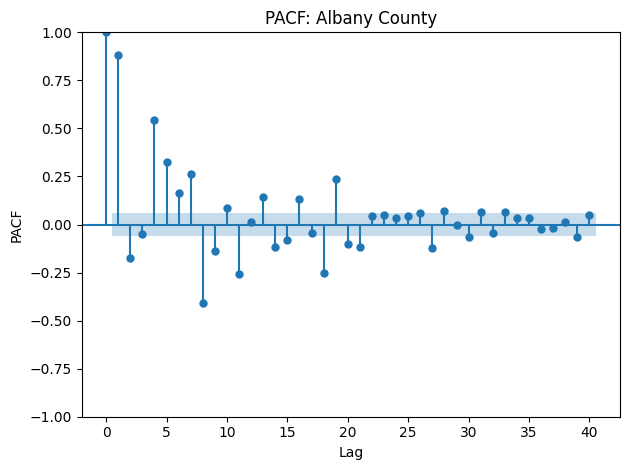

In [22]:
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.graphics.tsaplots import plot_pacf

# # Filter data for Albany County
albany_data = wy_daily_merged[wy_daily_merged['County'] == 'Albany']['smoothed_Cases_per_km2'].dropna()

# Create figure for Albany County
plt.figure(figsize=(10, 6))
plot_pacf(albany_data, lags=40, alpha=0.05, title='PACF: Albany County')
plt.xlabel('Lag')
plt.ylabel('PACF')
plt.tight_layout()
plt.show()

## ***4. Partial Autocorrelation Function (PACF) Analysis of Case Ratio (Population) for Albany***

<Figure size 1000x600 with 0 Axes>

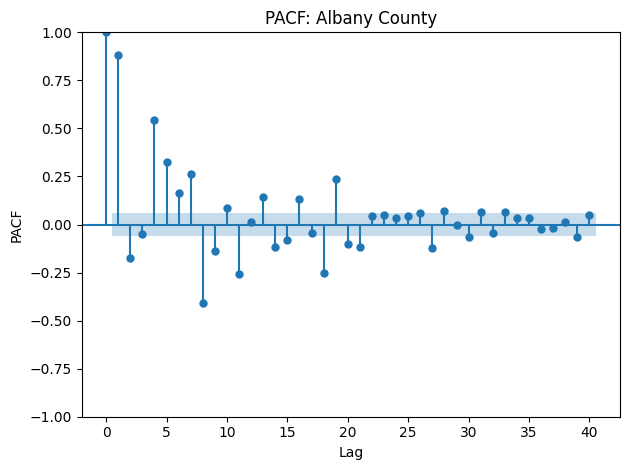

In [23]:
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.graphics.tsaplots import plot_pacf

# # Filter data for Albany County
albany_data = wy_daily_merged[wy_daily_merged['County'] == 'Albany']['smoothed_Cases_ratio'].dropna()

# Create figure for Albany County
plt.figure(figsize=(10, 6))
plot_pacf(albany_data, lags=40, alpha=0.05, title='PACF: Albany County')
plt.xlabel('Lag')
plt.ylabel('PACF')
plt.tight_layout()
plt.show()

### ***Power Spectral Density Analysis (PSD) Analysis (Cases Ratio)***

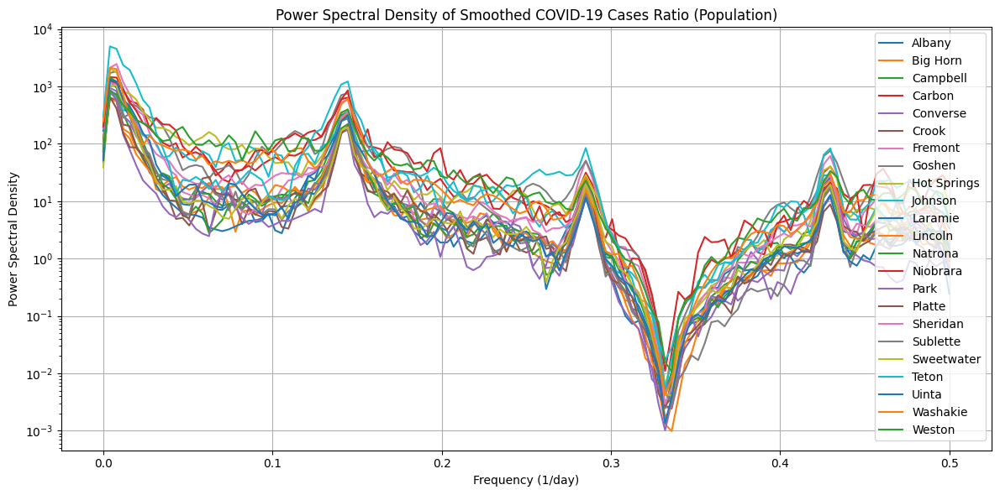

In [ ]:
from scipy.signal import welch

# Initialize DataFrame to store PSD results
psd_results = []

# Calculate PSD for each county
for county in wy_daily_merged['County'].unique():
    county_data = wy_daily_merged[wy_daily_merged['County'] == county].sort_values('Date')
    
    # # Extract time series and handle missing values
    ts = county_data['smoothed_Cases_ratio'].dropna().values
    
    # Compute PSD using Welch's method
    fs = 1.0  # Daily sampling frequency (1/day)
    f, Pxx = welch(ts, 
                  fs=fs,
                  window='hann',
                  nperseg=256,  # Segment length
                  noverlap=128,  # Overlap between segments
                  scaling='density')
    
    # Store results
    psd_results.extend([{
        'County': county,
        'Frequency': freq,
        'PSD': psd
    } for freq, psd in zip(f, Pxx)])

# Create results DataFrame
psd_df = pd.DataFrame(psd_results)


# Visualization
plt.figure(figsize=(12, 6))
for county in psd_df['County'].unique():  
    county_psd = psd_df[psd_df['County'] == county]
    plt.semilogy(county_psd['Frequency'], county_psd['PSD'], label=county)

plt.xlabel('Frequency (1/day)')
plt.ylabel('Power Spectral Density')
plt.title('Power Spectral Density of Smoothed COVID-19 Cases Ratio (Population)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

### ***Autocorrelation Function Analyis (ACF) (cases ratio)***

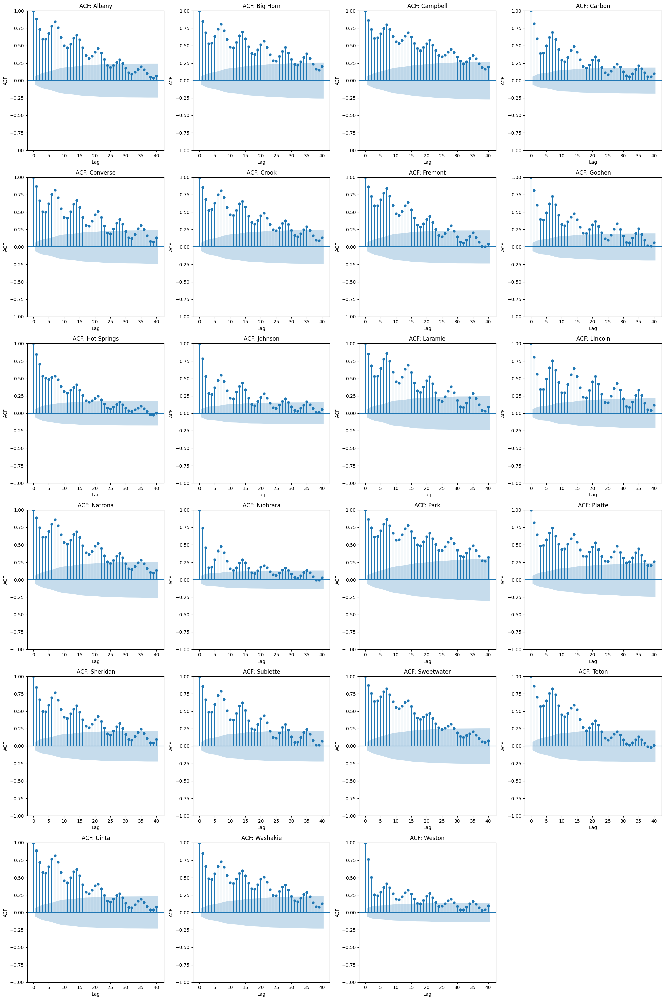

0        0.0
1        0.0
2        0.0
3        0.0
4        0.0
        ... 
26284    0.0
26285    0.0
26286    0.0
26287    0.0
26288    0.0
Name: smoothed_Cases_ratio, Length: 26289, dtype: float64

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.graphics.tsaplots import plot_acf

# Get unique counties and set up subplots
counties = wy_daily_merged['County'].unique()
n_counties = len(counties)
n_cols = 4  
n_rows = (n_counties + n_cols - 1) // n_cols

# Create figure
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 5*n_rows))
axes = axes.flatten()  

# Loop through counties and plot ACF
for i, county in enumerate(counties):
    ax = axes[i]
    county_data = wy_daily_merged[wy_daily_merged['County'] == county]['smoothed_Cases_ratio'].dropna()
    plot_acf(county_data, lags=40, alpha=0.05, ax=ax, title=f'ACF: {county}')
    ax.set_xlabel('Lag')
    ax.set_ylabel('ACF')

# Hide unused axes and adjust layout
for j in range(i+1, len(axes)):
    axes[j].axis('off')
fig.savefig(r'D:\WY-COVID Data\Moving Average 30 Days\ACF_ALL.pdf', format='pdf', bbox_inches='tight')
plt.tight_layout()
plt.show()

wy_daily_merged['smoothed_Cases_ratio']

### ***Partial Autocorrelation Function (PACF) Analysis (Cases_ratio)***

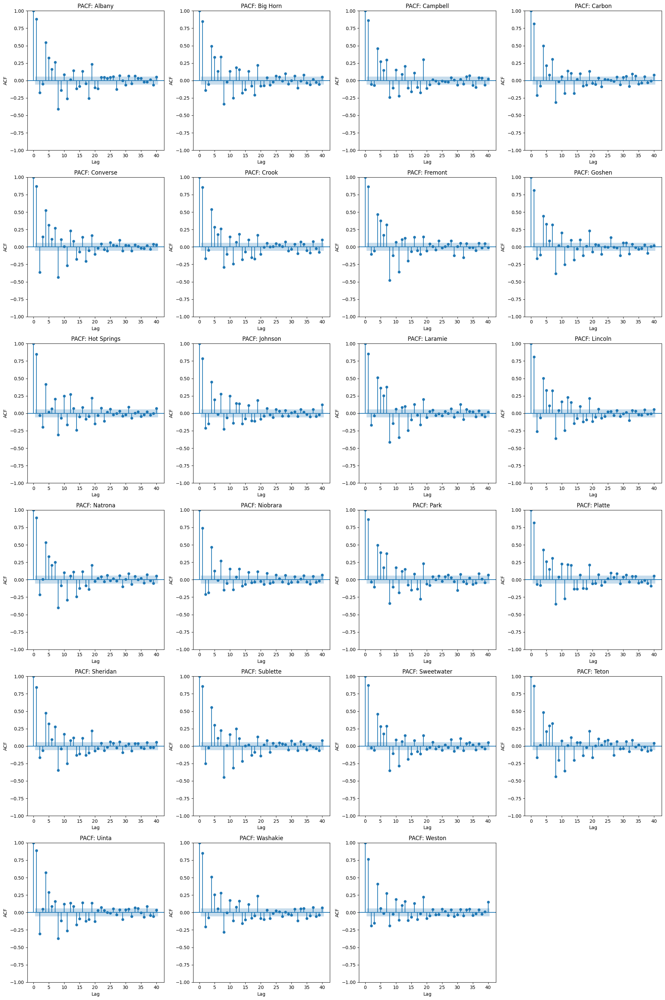

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.graphics.tsaplots import plot_pacf

# Get unique counties and set up subplots
counties = wy_daily_merged['County'].unique()
n_counties = len(counties)
n_cols = 4  # Adjust columns for your screen
n_rows = (n_counties + n_cols - 1) // n_cols

# Create figure
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 5*n_rows))
axes = axes.flatten() 

# Loop through counties and plot ACF
for i, county in enumerate(counties):
    ax = axes[i]
    # county_data = wy_daily_merged[wy_daily_merged['County'] == county]['smoothed_Cases_per_km2'].dropna()
    county_data = wy_daily_merged[wy_daily_merged['County'] == county]['smoothed_Cases_ratio'].dropna()
    plot_pacf(county_data, lags=40, alpha=0.05, ax=ax, title=f'PACF: {county}')
    ax.set_xlabel('Lag')
    ax.set_ylabel('ACF')


for j in range(i+1, len(axes)):
    axes[j].axis('off')
fig.savefig(r'D:\WY-COVID Data\Moving Average 30 Days\PACF_ALL.pdf', format='pdf', bbox_inches='tight')
plt.tight_layout()
plt.show()

### ***Visualization of Moving Average Filter***

In [ ]:
import plotly.graph_objects as go
import pandas as pd


wy_daily_merged['Date'] = pd.to_datetime(wy_daily_merged['Date'], format='%m/%d/%Y')

# Create an interactive figure
fig = go.Figure()

# Loop through each county and add a trace for its time series
for county in wy_daily_merged['County'].unique():
    county_data = wy_daily_merged[wy_daily_merged['County'] == county]
    
    hovertemplate = f'County: {county}<br>Date: %{{x|%b %d, %Y}}<br>Cases ratio: %{{y}}<extra></extra>'
    
    fig.add_trace(go.Scatter(
        x=county_data['Date'],
        y=county_data['smoothed_Cases_ratio'],  
        mode='lines+markers',
        name=county,
        line=dict(width=1),  
        marker=dict(size=2.5),  
        hovertemplate=hovertemplate
    ))

# Update layout for better visualization
fig.update_layout(
    title='Daily Total COVID-19 Cases Trends Across Wyoming Counties (Moving Average Cases Ratio)',
    xaxis_title='Date',
    yaxis_title='Cases/Total Population',
    xaxis=dict(
        tickformat="%b %Y",
        dtick="M2"  
    ),
    legend=dict(
        title="Counties",
        orientation="v",
        yanchor="top",
        y=1,
        xanchor="left",
        x=1.02,
        font=dict(size=9),
        traceorder="normal",
        itemclick="toggleothers",
        itemdoubleclick="toggle"
    ),
    hovermode="closest"
)

# Show the figure
fig.show()



## ***Applying the Seasonal Decomposition***

In [ ]:
import pandas as pd
import numpy as np
from statsmodels.tsa.seasonal import seasonal_decompose
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.express as px

# Prepare your data
wy_daily_merged['Date'] = pd.to_datetime(wy_daily_merged['Date'])
wy_daily_merged = wy_daily_merged.sort_values('Date')

# Build a consistent color map for counties
counties = wy_daily_merged['County'].unique()
palette = px.colors.qualitative.Plotly
color_map = {county: palette[i % len(palette)] for i, county in enumerate(counties)}

# Perform the decomposition for each county and store results
decomposition_results = []
for county in counties:
    county_df = wy_daily_merged[wy_daily_merged['County'] == county].copy()
    county_df.set_index('Date', inplace=True)
    ts = county_df['Cases_ratio']
    try:
        res = seasonal_decompose(
            ts,
            period=7,
            model="additive",
            extrapolate_trend="freq",
            filt=np.repeat(1/7, 7)
        )
        decomposition_results.append({
            'county': county,
            'observed': res.observed,
            'trend': res.trend
        })
    except ValueError as e:
        print(f"Decomposition failed for county {county}: {e}")

# Create subplots
fig = make_subplots(
    rows=2, cols=1,
    subplot_titles=[
        "Initial Temporal Profile of COVID-19 Case Counts",
        "Smoothed Trend (7-Day Moving Average)"
    ],
    shared_xaxes=True,
    vertical_spacing=0.04
)

# Add traces with consistent colors and legend groups
for entry in decomposition_results:
    county = entry['county']
    color = color_map[county]

    # Observed
    fig.add_trace(
        go.Scatter(
            x=entry['observed'].index,
            y=entry['observed'],
            mode='lines',
            name=county,
            legendgroup=county,
            line=dict(color=color)
        ),
        row=1, col=1
    )
    # Trend
    fig.add_trace(
        go.Scatter(
            x=entry['trend'].index,
            y=entry['trend'],
            mode='lines',
            name=county,
            legendgroup=county,
            line=dict(color=color),
            showlegend=False  
        ),
        row=2, col=1
    )

# Update layout to isolate on click and apply legend style
fig.update_layout(
    title=dict(
        text="Wyoming COVID-19 Daily Profiles and 3-Day Moving Average by County",
        x=0.5,
        font=dict(size=22)
    ),
    width=1400,
    height=860,
    legend=dict(
        title="Counties",
        x=1.03,
        y=1,
        itemclick="toggleothers",
        itemdoubleclick="toggle"
    )
)

# Adjust y-axis titles per subplot
fig.update_yaxes(title_text="Cases/Total Population", row=1, col=1)
fig.update_yaxes(title_text="Smoothed cases ratio", row=2, col=1)
fig.update_xaxes (title_text = 'Date', row = 2, col = 1)
fig.show()
fig.write_html(r"D:\WY-COVID Data\Committee_Meeting\All_Counties_Initial_cases_ratio.html")




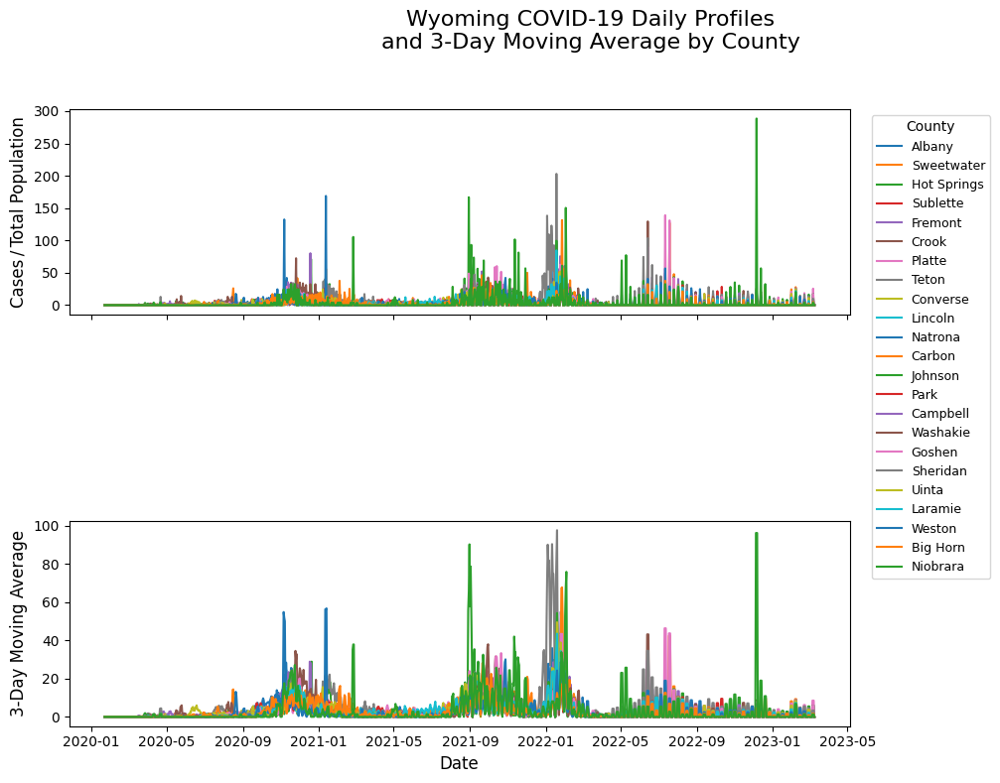

In [29]:
import pandas as pd
import matplotlib.pyplot as plt

# 1. Prepare the data
wy = wy_daily_merged.copy()
wy['Date'] = pd.to_datetime(wy['Date'])
wy.sort_values('Date', inplace=True)

# 2. Set up the figure
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8), sharex=True)

# 3. Plot each county
for county in wy['County'].unique():
    df = wy[wy['County'] == county].set_index('Date')
    ts = df['Cases_ratio']
    
    # raw series
    ax1.plot(ts.index, ts, label=county)
    # 3-day centered moving average
    ma3 = ts.rolling(window=3, center=True, min_periods=1).mean()
    ax2.plot(ma3.index, ma3, label=county)

# 4. Formatting
ax1.set_ylabel('Cases / Total Population', fontsize=12)
ax2.set_ylabel('3-Day Moving Average', fontsize=12)
ax2.set_xlabel('Date', fontsize=12)

fig.suptitle(
    "Wyoming COVID-19 Daily Profiles\nand 3-Day Moving Average by County",
    fontsize=16, y=0.98
)

# single legend on top panel, outside
ax1.legend(
    title='County', 
    bbox_to_anchor=(1.02, 1), 
    loc='upper left', 
    fontsize=9
)

plt.tight_layout(rect=[0, 0, 0.85, 0.95])

# 5. Save high-res file
fig.savefig(
    "All_Counties_3Day_MA.png", 
    dpi=300, 
    bbox_inches='tight'
)
# Or for vector‐quality:
# fig.savefig("All_Counties_3Day_MA.pdf", dpi=300, bbox_inches='tight')

plt.show()


### ***Plotting Absolute Daily COVID Cases Normalized by the Total Population***

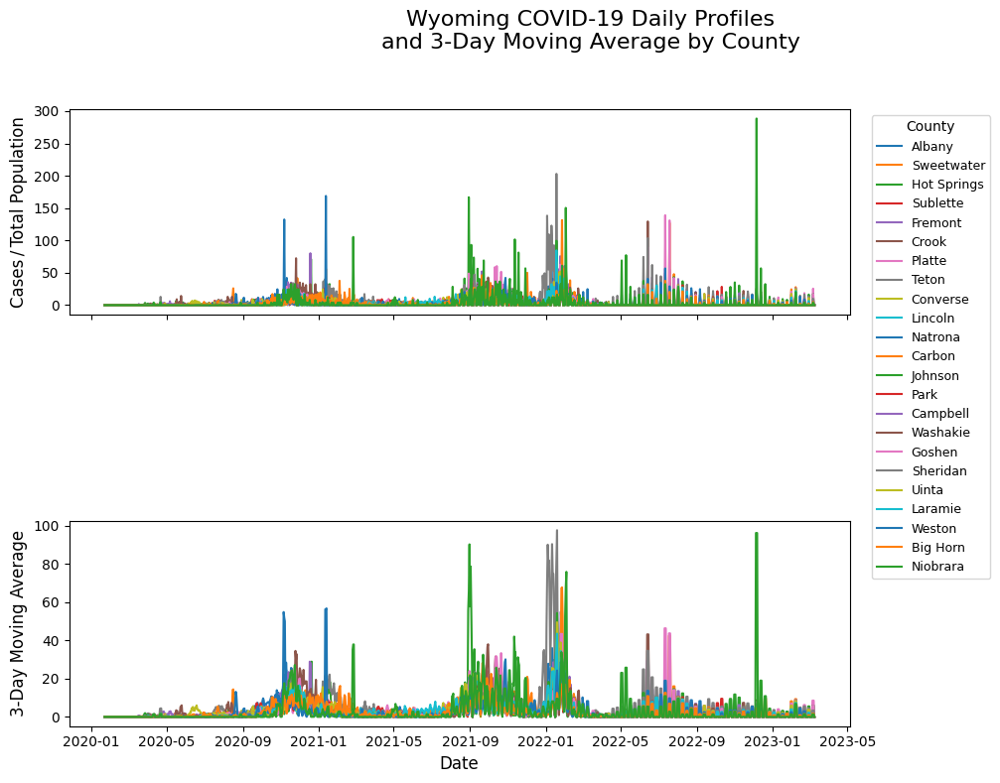

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Prepare the data
wy = wy_daily_merged.copy()
wy['Date'] = pd.to_datetime(wy['Date'])
wy.sort_values('Date', inplace=True)

# Set up the figure
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8), sharex=True)

# Plot each county
for county in wy['County'].unique():
    df = wy[wy['County'] == county].set_index('Date')
    ts = df['Cases_ratio']
    
    # raw series
    ax1.plot(ts.index, ts, label=county)
    # 3-day centered moving average
    ma3 = ts.rolling(window=3, center=True, min_periods=1).mean()
    ax2.plot(ma3.index, ma3, label=county)

# 4. Formatting
ax1.set_ylabel('Cases / Total Population', fontsize=12)
ax2.set_ylabel('3-Day Moving Average', fontsize=12)
ax2.set_xlabel('Date', fontsize=12)

fig.suptitle(
    "Wyoming COVID-19 Daily Profiles\nand 3-Day Moving Average by County",
    fontsize=16, y=0.98
)

# single legend on top panel, outside
ax1.legend(
    title='County', 
    bbox_to_anchor=(1.02, 1), 
    loc='upper left', 
    fontsize=9
)

plt.tight_layout(rect=[0, 0, 0.85, 0.95])

# Save high-res file
fig.savefig(
    "All_Counties_3Day_MA.png", 
    dpi=300, 
    bbox_inches='tight'
)
# Or for vector‐quality:
# fig.savefig("All_Counties_3Day_MA.pdf", dpi=300, bbox_inches='tight')

plt.show()


### ***Plotting the Absolute Daily COVID Cases per Square Kilometer Based on Population Density***

In [31]:
# import plotly.graph_objects as go
# import pandas as pd

# # Ensure the Date column is parsed as datetime
# wy_daily_merged['Date'] = pd.to_datetime(wy_daily_merged['Date'], format='%m/%d/%Y')

# # Create an interactive figure
# fig = go.Figure()

# # Loop through each county and add a trace for its time series
# for county in wy_daily_merged['County'].unique():
#     county_data = wy_daily_merged[wy_daily_merged['County'] == county]
    
#     hovertemplate = f'County: {county}<br>Date: %{{x|%b %d, %Y}}<br>Cases/km²: %{{y}}<extra></extra>'
    
#     fig.add_trace(go.Scatter(
#         x=county_data['Date'],
#         y=county_data['Cases_per_km2'],  # Ensure this column exists
#         mode='lines+markers',
#         name=county,
#         line=dict(width=1),  # Thin lines for clarity
#         marker=dict(size=2.5),  # Small markers to avoid clutter
#         hovertemplate=hovertemplate
#     ))

# # Update layout for better visualization
# fig.update_layout(
#     title='Daily Total COVID-19 Cases Trends Across Wyoming Counties (Per km²)',
#     xaxis_title='Date',
#     yaxis_title='Cases per km²',
#     xaxis=dict(
#         tickformat="%b %Y",
#         dtick="M2"  # Tick every 2 months
#     ),
#     legend=dict(
#         title="Counties",
#         orientation="v",
#         yanchor="top",
#         y=1,
#         xanchor="left",
#         x=1.02,
#         font=dict(size=9),
#         traceorder="normal",
#         itemclick="toggleothers",
#         itemdoubleclick="toggle"
#     ),
#     hovermode="closest"
# )

# # Show the figure
# fig.show()

# fig.write_html("All_Counties_Daily_Absolute_per_km2.html")


### ***Daily Absolute COVID Cases Normalized by Total Population for Albany County***

In [ ]:
import plotly.graph_objects as go
import pandas as pd


wy_daily_merged['Date'] = pd.to_datetime(wy_daily_merged['Date'], format='%m/%d/%Y')

# Create an interactive figure
fig = go.Figure()

# Filter only Albany County
county = 'Albany'
county_data = wy_daily_merged[wy_daily_merged['County'] == county]

# Define hover template
hovertemplate = f'County: {county}<br>Date: %{{x|%b %d, %Y}}<br>Cases/1000: %{{y}}<extra></extra>'

# Add trace for Albany County
fig.add_trace(go.Scatter(
    x=county_data['Date'],
    y=county_data['Cases_ratio'],
    mode='lines+markers',
    name=county,
    line=dict(width=1),   # Reduced line width for clarity
    marker=dict(size=2.5),  # Reduced marker size for a cleaner look
    hovertemplate=hovertemplate
))

# Update layout for better formatting
fig.update_layout(
    title='Daily Absolute COVID-19 Cases as a Fraction of Total County Population (Albany)',
    xaxis_title='Date',
    yaxis_title='Cases/Total Population',
    xaxis=dict(
        tickformat="%b %Y",
        dtick="M2"  # Tick every 2 months
    ),
    legend=dict(
        title="Counties",
        orientation="v",
        yanchor="top",
        y=1,
        xanchor="left",
        x=1.05,
        font=dict(size=10),
        traceorder="normal",
        itemclick="toggleothers",
        itemdoubleclick="toggle"
    ),
    hovermode="closest"
)

# Show the figure
fig.show()


fig.write_html("Albany_Daily_Absolute_cases_ratio.html")



### ***Daily Absolute COVID Cases Normalized by Population Density (Albany County)***

In [33]:



# import plotly.graph_objects as go
# import pandas as pd

# # Ensure the Date column is parsed as datetime
# wy_daily_merged['Date'] = pd.to_datetime(wy_daily_merged['Date'], format='%m/%d/%Y')

# # Filter data for only Albany County
# albany_data = wy_daily_merged[wy_daily_merged['County'] == "Albany"]

# # Create an interactive figure
# fig = go.Figure()

# # Add a trace for Albany County
# fig.add_trace(go.Scatter(
#     x=albany_data['Date'],
#     y=albany_data['Cases_per_km2'],  # Ensure this column exists
#     mode='lines+markers',
#     name="Albany",
#     line=dict(width=1),  # Thin lines for clarity
#     marker=dict(size=2.5),  # Small markers to avoid clutter
#     hovertemplate='County: Albany<br>Date: %{x|%b %d, %Y}<br>Cases/km²: %{y}<extra></extra>'
# ))

# # Update layout for better visualization
# fig.update_layout(
#     title='Daily Absolute COVID-19 Cases Trends in Albany County (Per km²)',
#     xaxis_title='Date',
#     yaxis_title='Cases per km²',
#     xaxis=dict(
#         tickformat="%b %Y",
#         dtick="M2"  # Tick every 2 months
#     ),
#     legend=dict(
#         title="County",
#         orientation="v",
#         yanchor="top",
#         y=1,
#         xanchor="left",
#         x=1.02,
#         font=dict(size=10),
#         traceorder="normal",
#         itemclick="toggleothers",
#         itemdoubleclick="toggle"
#     ),
#     hovermode="closest"
# )

# # Show the figure
# fig.show()
# fig.write_html("Albany_Daily_absolute_per_km2.html")

In [34]:
# # Filter daily COVID cases for Wyoming and exclude 'Out of WY' and 'Unassigned' counties
# wyoming_daily_Cases = ts_data[
#     (ts_data['Province_State'] == 'Wyoming') &
#     (~ts_data['County'].isin(['Out of WY', 'Unassigned']))
# ]

# # Convert the filtered DataFrame into a GeoDataFrame using longitude and latitude
# wy_daily_gdf = gpd.GeoDataFrame(
#     wyoming_daily_Cases, 
#     geometry=gpd.points_from_xy(wyoming_daily_Cases['Long_'], wyoming_daily_Cases['Lat'],
#                                 crs="EPSG:4326")
# )

# # # Change the coordinate reference system to EPSG:26912
# wy_daily_gdf = wy_daily_gdf.to_crs(epsg=26912)

# # Save the Wyoming daily COVID cases data to a CSV file
# wy_daily_gdf.to_csv('complete_wy_daily_cases.csv', index=False)

### ***Time Series Plot of the Total COVID Cases here in Wyoming Per County***

In [35]:
# import matplotlib.pyplot as plt
# import matplotlib.dates as mdates
# import numpy as np

# plt.figure(figsize=(18, 10))

# # Create a colormap with distinct colors
# colors = plt.cm.get_cmap('tab20', len(wyoming_daily_Cases['County'].unique()))

# # Plot each county's time series
# for i, county in enumerate(wyoming_daily_Cases['County'].unique()):
#     county_data = wyoming_daily_Cases[wyoming_daily_Cases['County'] == county]
#     plt.plot(county_data['Date'], county_data['Cases'],
#              color=colors(i),
#              linewidth=1.5,
#              marker='o',
#              markersize=4,
#              label=county)

# # Format dates
# plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=2))
# plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
# plt.gcf().autofmt_xdate(rotation=45)

# # Add labels and title
# plt.title('COVID-19 Cases Trends Across Wyoming Counties', fontsize=14, pad=20)
# plt.xlabel('Date', fontsize=12)
# plt.ylabel('Total Cases', fontsize=12)
# plt.grid(True, alpha=0.3)

# # Add legend
# plt.legend(bbox_to_anchor=(1.05, 1), 
#            loc='upper left', 
#            borderaxespad=0.,
#            fontsize=9,
#            ncol=2)

# plt.tight_layout()
# plt.show()

### ***Working With the Monthly data for Wyoming***


In [36]:
# # Filter Wyoming data while removing 'Out of WY' and 'Unassigned' counties
# wyoming_gdf = monthly_gdf[
#     (monthly_gdf['Province_State'] == 'Wyoming') &
#     (~monthly_gdf['County'].isin(['Out of WY', 'Unassigned']))
# ]
# # Changing projected coordinate system
# wyoming_gdf = wyoming_gdf.to_crs(epsg=26912)
# # Save to CSV
# wyoming_gdf.to_csv('Wyoming_Monthly_Cumulative_Case_Geo1.csv', index=False)

## ***Time Series Plot of the Cumulative Monthly COVID Cases for Different Counties in Wyoming***

This code visualizes the monthly cumulative COVID-19 cases for Albany, Teton and Big Horn Counties using Matplotlib. It starts by filtering the processed GeoDataFrame (`monthly_gdf`) for each of the counties data. Then, it creates a line plot with dates on the x-axis and case counts on the y-axis. 

Key functions include:

- **`plt.plot()`**: Plots the line graph with specified styling.
- **`mdates.MonthLocator()`**: Sets the x-axis ticks at 3-month intervals.
- **`mdates.DateFormatter()`**: Formats the x-axis labels as abbreviated month and year (e.g., "Jan 2021").

The code also adds a title, axis labels, grid lines, and rotates the x-axis labels for better readability before displaying the plot.


In [37]:
# import matplotlib.pyplot as plt
# import matplotlib.dates as mdates
# import numpy as np

# plt.figure(figsize=(18, 10))

# # Create a colormap with distinct colors
# colors = plt.cm.get_cmap('tab20', len(wyoming_gdf['County'].unique()))

# # Plot each county's time series
# for i, county in enumerate(wyoming_gdf['County'].unique()):
#     county_data = wyoming_gdf[wyoming_gdf['County'] == county]
#     plt.plot(county_data['Date'], county_data['Cases'],
#              color=colors(i),
#              linewidth=1.5,
#              marker='o',
#              markersize=4,
#              label=county)

# # Format dates
# plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=2))
# plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
# plt.gcf().autofmt_xdate(rotation=45)

# # Add labels and title
# plt.title('COVID-19 Cases Trends Across Wyoming Counties', fontsize=14, pad=20)
# plt.xlabel('Date', fontsize=12)
# plt.ylabel('Total Cases', fontsize=12)
# plt.grid(True, alpha=0.3)

# # Add legend
# plt.legend(bbox_to_anchor=(1.05, 1), 
#            loc='upper left', 
#            borderaxespad=0.,
#            fontsize=9,
#            ncol=2)

# plt.tight_layout()
# plt.show()

### ***Time Series Analysis of Cumulative Monthly COVID-19 Cases in Wyoming's Neighboring Colorado Counties***

In [38]:
# # Filtering data for the state of Colorado Counties
# # Filter Wyoming data while removing 'Out of WY' and 'Unassigned' counties
# co_gdf = monthly_gdf[
#     (monthly_gdf['Province_State'] == 'Colorado') &
#     (~monthly_gdf['County'].isin(['Out of CO', 'Unassigned']))
# ]

# # Save to CSV
# co_gdf.to_csv('Colorado_Monthly_Cumulative_Case_Geo.csv', index=False)
# co_gdf

In [39]:
# import matplotlib.pyplot as plt
# import matplotlib.dates as mdates

# # List of Colorado counties neighboring Wyoming (corrected commas)
# co_counties = ['Moffat', 'Routt', 'Jackson', 'Larimer', 'Weld', 'Logan', 
#                'Morgan', 'Elbert', 'Douglas', 'Arapahoe', 'Adams', 'Denver', 
#                'Jefferson', 'Clear Creek', 'Gilpin', 'Broomfield', 'Boulder', 'Grand']

# plt.figure(figsize=(18, 10))

# # Create a colormap with distinct colors
# colors = plt.cm.get_cmap('tab20', len(co_counties))

# # Plot each county's time series
# for i, county in enumerate(co_counties):
#     county_data = co_gdf[co_gdf['County'] == county]  # Ensure co_gdf is defined with Colorado data
#     plt.plot(county_data['Date'], county_data['Cases'],
#              color=colors(i),
#              linewidth=1.5,
#              marker='o',
#              markersize=4,
#              label=county)

# # Format the x-axis dates: set ticks every 2 months and format as 'Mon Year'
# plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=2))
# plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
# plt.gcf().autofmt_xdate(rotation=45)

# # Add labels and an excellent title
# plt.title('Time Series Analysis of Cumulative Monthly COVID-19 Cases in Colorado Counties Bordering Wyoming', 
#           fontsize=16, pad=20)
# plt.xlabel('Date', fontsize=14)
# plt.ylabel('Total Cases', fontsize=14)
# plt.grid(True, alpha=0.3)

# # Add a legend outside the plot area for clarity
# plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0., fontsize=9, ncol=2)

# plt.tight_layout()
# plt.show()


### ***Normalization Monthly Cummulative COVID Cases to the County Level***

In [40]:
# # Reading the total pupulation of the wyoming counties

# wy_population = gpd.read_file (r'C:\Users\chenxu.COOLGIS\Desktop\WY-COVID Data\Wyoming_total_population.shp')
# wy_population = wy_population.rename(columns={"ttl_ppl":"Total_Population"})

# # Changing projected coordinate system
# wy_population = wy_population.to_crs(epsg=26912)

# # Calcualting the area of Wyoming into square meter
# wy_population['Area_sqm'] = wy_population.geometry.area

# # Converting the area into square kilometer
# wy_population ['Area_sqkm'] = wy_population['Area_sqm']/1e6

# ## Calcualting the population density for the state of Wyoming
# wy_population['Pop_Density'] = wy_population['Total_Population']/wy_population['Area_sqkm']

# # Clean county names
# wy_population["NAME"] = wy_population["NAME"].str.replace(r" County|, Wyoming", "", regex=True)

# ## Rename the column from "NAME" to "County"
# wy_population = wy_population.rename(columns={"NAME": "County"})

### ***Spatial Join for Daily Cummulative COVID Cases in the State of Wyoming***

In [41]:
# # Spatial Join
# wy_daily_merged = gpd.sjoin(wy_daily_gdf, wy_population, how = "left", predicate='within')

# # Normalizing the total COVID cases per 1000 people
# wy_daily_merged['Cases_per_1000'] = (wy_daily_merged['Cases'] / wy_daily_merged['Total_Population']) *1000

# # Normalize the Total COVID cases by Population Density
# wy_daily_merged['Cases_per_km2'] = wy_daily_merged['Cases'] /wy_daily_merged ['Pop_Density']

# ## Rename the column from "NAME" to "County"
# wy_daily_merged = wy_daily_merged.rename(columns={"County_left": "County"})

# wy_daily_merged.to_csv('wy_daily_cummulative.csv', index = False)
# wy_daily_merged

### ***Plotting Normalized Daily Cummulative COVID Cases***

In [42]:
# wy_daily_merged['County'].unique ()

### 1.1 ***Plotting Cummulative Daily Total COVID Cases per 1000 people***

In [43]:
# import plotly.graph_objects as go
# import pandas as pd

# # Ensure the Date column is parsed as datetime
# wy_daily_merged['Date'] = pd.to_datetime(wy_daily_merged['Date'], format='%m/%d/%Y')

# # Create an interactive figure
# fig = go.Figure()

# # Loop through each county and add a trace for its time series
# for county in wy_daily_merged['County'].unique():
#     county_data = wy_daily_merged[wy_daily_merged['County'] == county]
#     hovertemplate = f'County: {county}<br>Date: %{{x|%b %d, %Y}}<br>Cases/1000: %{{y}}<extra></extra>'
#     fig.add_trace(go.Scatter(
#         x=county_data['Date'],
#         y=county_data['Cases_per_1000'],
#         mode='lines+markers',
#         name=county,
#         line=dict(width=1),   # Reduced line width for clarity
#         marker=dict(size=2.5),  # Reduced marker size for a cleaner look
#         hovertemplate=hovertemplate
#     ))

# # Update layout for better formatting
# fig.update_layout(
#     title='Daily Cumulative COVID-19 Cases Trends Across Wyoming Counties (Per 1000 People)',
#     xaxis_title='Date',
#     yaxis_title='Cases per 1,000 People',
#     xaxis=dict(
#         tickformat="%b %Y",
#         dtick="M2"  # Tick every 2 months
#     ),
#     legend=dict(
#         title="Counties",
#         orientation="v",
#         yanchor="top",
#         y=1,
#         xanchor="left",
#         x=1.05,
#         font=dict(size=10),
#         traceorder="normal",
#         itemclick="toggleothers",
#         itemdoubleclick="toggle"
#     ),
#     hovermode="closest"
# )

# fig.show()

# fig.write_html("All_Counties_Daily_Cummulative_per_1000.html")



### ***1.1.1 Plotting Cummulative Daily COVID Cases per 1000 People for Albany County***

In [44]:
# import plotly.graph_objects as go
# import pandas as pd

# # Ensure the Date column is parsed as datetime
# wy_daily_merged['Date'] = pd.to_datetime(wy_daily_merged['Date'], format='%m/%d/%Y')

# # Create an interactive figure
# fig = go.Figure()

# # Filter only Albany County
# county = 'Albany'
# county_data = wy_daily_merged[wy_daily_merged['County'] == county]

# # Define hover template
# hovertemplate = f'County: {county}<br>Date: %{{x|%b %d, %Y}}<br>Cases/1000: %{{y}}<extra></extra>'

# # Add trace for Albany County
# fig.add_trace(go.Scatter(
#     x=county_data['Date'],
#     y=county_data['Cases_per_1000'],
#     mode='lines+markers',
#     name=county,
#     line=dict(width=1),   # Reduced line width for clarity
#     marker=dict(size=2.5),  # Reduced marker size for a cleaner look
#     hovertemplate=hovertemplate
# ))

# # Update layout for better formatting
# fig.update_layout(
#     title='Daily Cumulative COVID-19 Cases Trends Across Albany County (Per 1000 People)',
#     xaxis_title='Date',
#     yaxis_title='Cases per 1,000 People',
#     xaxis=dict(
#         tickformat="%b %Y",
#         dtick="M2"  # Tick every 2 months
#     ),
#     legend=dict(
#         title="Counties",
#         orientation="v",
#         yanchor="top",
#         y=1,
#         xanchor="left",
#         x=1.05,
#         font=dict(size=10),
#         traceorder="normal",
#         itemclick="toggleothers",
#         itemdoubleclick="toggle"
#     ),
#     hovermode="closest"
# )

# # Show the figure
# fig.show()


# fig.write_html("Albany_Daily_Cummulative_per_1000.html")




### ***1.2 Plotting Daily Cummulative COVID Cases per Square Kilometer Based on Population Density***

In [45]:
# import plotly.graph_objects as go
# import pandas as pd

# # Ensure the Date column is parsed as datetime
# wy_daily_merged['Date'] = pd.to_datetime(wy_daily_merged['Date'], format='%m/%d/%Y')

# # Create an interactive figure
# fig = go.Figure()

# # Loop through each county and add a trace for its time series
# for county in wy_daily_merged['County'].unique():
#     county_data = wy_daily_merged[wy_daily_merged['County'] == county]
    
#     hovertemplate = f'County: {county}<br>Date: %{{x|%b %d, %Y}}<br>Cases/km²: %{{y}}<extra></extra>'
    
#     fig.add_trace(go.Scatter(
#         x=county_data['Date'],
#         y=county_data['Cases_per_km2'],  # Ensure this column exists
#         mode='lines+markers',
#         name=county,
#         line=dict(width=1),  # Thin lines for clarity
#         marker=dict(size=2.5),  # Small markers to avoid clutter
#         hovertemplate=hovertemplate
#     ))

# # Update layout for better visualization
# fig.update_layout(
#     title='Daily Cumulative COVID-19 Cases Trends Across Wyoming Counties (Per km²)',
#     xaxis_title='Date',
#     yaxis_title='Cases per km²',
#     xaxis=dict(
#         tickformat="%b %Y",
#         dtick="M2"  # Tick every 2 months
#     ),
#     legend=dict(
#         title="Counties",
#         orientation="v",
#         yanchor="top",
#         y=1,
#         xanchor="left",
#         x=1.02,
#         font=dict(size=9),
#         traceorder="normal",
#         itemclick="toggleothers",
#         itemdoubleclick="toggle"
#     ),
#     hovermode="closest"
# )

# # Show the figure
# fig.show()

# fig.write_html("All_Counties_Daily_Cummulative_per_km2.html")


### ***1.1.1 Plotting Cummulative Daily COVID Cases per Square Kilometer for Albany County***

In [46]:
# import plotly.graph_objects as go
# import pandas as pd

# # Ensure the Date column is parsed as datetime
# wy_daily_merged['Date'] = pd.to_datetime(wy_daily_merged['Date'], format='%m/%d/%Y')

# # Filter data for only Albany County
# albany_data = wy_daily_merged[wy_daily_merged['County'] == "Albany"]

# # Create an interactive figure
# fig = go.Figure()

# # Add a trace for Albany County
# fig.add_trace(go.Scatter(
#     x=albany_data['Date'],
#     y=albany_data['Cases_per_km2'],  # Ensure this column exists
#     mode='lines+markers',
#     name="Albany",
#     line=dict(width=1),  # Thin lines for clarity
#     marker=dict(size=2.5),  # Small markers to avoid clutter
#     hovertemplate='County: Albany<br>Date: %{x|%b %d, %Y}<br>Cases/km²: %{y}<extra></extra>'
# ))

# # Update layout for better visualization
# fig.update_layout(
#     title='Daily Cumulative COVID-19 Cases Trends in Albany County (Per km²)',
#     xaxis_title='Date',
#     yaxis_title='Cases per km²',
#     xaxis=dict(
#         tickformat="%b %Y",
#         dtick="M2"  # Tick every 2 months
#     ),
#     legend=dict(
#         title="County",
#         orientation="v",
#         yanchor="top",
#         y=1,
#         xanchor="left",
#         x=1.02,
#         font=dict(size=10),
#         traceorder="normal",
#         itemclick="toggleothers",
#         itemdoubleclick="toggle"
#     ),
#     hovermode="closest"
# )

# # Show the figure
# fig.show()
# fig.write_html("Albany_Daily_Cummulative_per_km2.html")

### ***Spatial Join for Monthly Cummulative COVID Cases (Using County Name)***

In this section i want to join both `wyoming_gdf` and `wy_population` datasets based on the common column name i.e. `County`.

In [47]:
# # Performing Spatial Join
# wyoming_merged = gpd.sjoin(wyoming_gdf, wy_population, how="left", predicate="within")

# # # Perform an attribute join using 'NAME' (County Name)
# # wyoming_merged = wyoming_gdf.merge(wy_population, on="County", how="left")

# # Normalizing the total COVID cases per 1000 people
# wyoming_merged['Cases_per_1000'] = (wyoming_merged['Cases'] / wyoming_merged['Total_Population']) *1000

# # Normalize the Total COVID cases by Population Density
# wyoming_merged['Cases_per_km2'] = wyoming_merged['Cases'] /wyoming_merged ['Pop_Density']

# ## Rename the column from "NAME" to "County"
# wyoming_merged = wyoming_merged.rename(columns={"County_left": "County"})
# # Save to CSV
# wyoming_merged.to_csv ('Normalized_Wy_Monthly_Cumulative_COVID_Cases.csv', index=False)
# wyoming_merged

### ***Time Series Plot of the Normalized Cumulative Monthly COVID Cases for Different Counties in Wyoming***

### 1.1 ***Plotting Cummulative Monthly Total COVID Cases per 1000 people***

In [48]:
# import matplotlib.pyplot as plt
# import matplotlib.dates as mdates
# import matplotlib

# plt.figure(figsize=(18, 10))

# # Use the new approach for getting the colormap (avoid deprecated get_cmap)
# colors = matplotlib.colormaps['tab20']

# # # Verify that the "County" column exists:
# # print("Columns in merged DataFrame:", wyoming_merged.columns)

# # Plot each county's time series using the merged DataFrame
# for i, county in enumerate(wyoming_merged['County'].unique()):
#     county_data = wyoming_merged[wyoming_merged['County'] == county]
#     plt.plot(county_data['Date'], county_data['Cases_per_1000'],
#              color=colors(i % 20),  # Tab20 has 20 colors; use modulo for extra counties
#              linewidth=1.5,
#              marker='o',
#              markersize=4,
#              label=county)
    
#     # Attach the county name to the last data point
#     last_date = county_data['Date'].iloc[-1]
#     last_value = county_data['Cases_per_1000'].iloc[-1]
#     plt.text(last_date, last_value, county, fontsize=9,
#              verticalalignment='bottom', horizontalalignment='left')

# # Format dates on the x-axis
# plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=2))
# plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
# plt.gcf().autofmt_xdate(rotation=45)

# # Add labels and title
# plt.title('Monthly Cumulative COVID-19 Cases Trends Across Wyoming Counties (Per 1000 People)', fontsize=14, pad=20)
# plt.xlabel('Date', fontsize=12)
# plt.ylabel('Cases per 1,000 People', fontsize=12)
# plt.grid(True, alpha=0.3)

# # Add legend outside the plot
# plt.legend(bbox_to_anchor=(1.05, 1), 
#            loc='upper left', 
#            borderaxespad=0.,
#            fontsize=9,
#            ncol=2)

# plt.tight_layout()
# plt.show()

### ***1.1.1 Plotting Cummulative Monthly COVID Cases per 1000 People for Albany County***

In [49]:
# import matplotlib.pyplot as plt
# import matplotlib.dates as mdates
# import matplotlib

# # Filter the merged DataFrame for Albany county only
# albany_data = wyoming_merged[wyoming_merged['County'] == 'Albany']

# plt.figure(figsize=(18, 10))
# colors = matplotlib.colormaps['tab20']

# # Plot Albany county's time series: Date vs. Cases per 1000 people
# plt.plot(albany_data['Date'], albany_data['Cases_per_1000'],
#          color=colors(0),      # Use the first color from the Tab20 colormap
#          linewidth=1.5,
#          marker='o',
#          markersize=4,
#          label='Albany')

# # Annotate the last data point with the county name
# last_date = albany_data['Date'].iloc[-1]
# last_value = albany_data['Cases_per_1000'].iloc[-1]
# plt.text(last_date, last_value, 'Albany', fontsize=9,
#          verticalalignment='bottom', horizontalalignment='left')

# # Format the x-axis to display dates clearly
# plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=2))
# plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
# plt.gcf().autofmt_xdate(rotation=45)

# # Set plot title and axis labels
# plt.title('Monthly Cumulative COVID-19 Cases Trends Across Albany County (Per 1000 People)', fontsize=14, pad=20)
# plt.xlabel('Date', fontsize=12)
# plt.ylabel('Cases per 1,000 People', fontsize=12)
# plt.grid(True, alpha=0.3)

# # Add a legend outside the plot area
# plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0., fontsize=9)

# plt.tight_layout()
# plt.show()


### ***1.2 Plotting Monthly Cummulative COVID Cases per Square Kilometer Based on Population Density***

In [50]:
# import matplotlib.pyplot as plt
# import matplotlib.dates as mdates
# import matplotlib

# plt.figure(figsize=(18, 10))

# # Use the new approach for getting the colormap (avoid deprecated get_cmap)
# colors = matplotlib.colormaps['tab20']

# # # Verify that the "County" column exists:
# # print("Columns in merged DataFrame:", wyoming_merged.columns)

# # Plot each county's time series using the merged DataFrame
# for i, county in enumerate(wyoming_merged['County'].unique()):
#     county_data = wyoming_merged[wyoming_merged['County'] == county]
#     plt.plot(county_data['Date'], county_data['Cases_per_km2'],
#              color=colors(i % 20),  # Tab20 has 20 colors; use modulo for extra counties
#              linewidth=1.5,
#              marker='o',
#              markersize=4,
#              label=county)
    
#     # Attach the county name to the last data point
#     last_date = county_data['Date'].iloc[-1]
#     last_value = county_data['Cases_per_km2'].iloc[-1]
#     plt.text(last_date, last_value, county, fontsize=9,
#              verticalalignment='bottom', horizontalalignment='left')

# # Format dates on the x-axis
# plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=2))
# plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
# plt.gcf().autofmt_xdate(rotation=45)

# # Add labels and title
# plt.title('Monthly Cumulative COVID-19 Cases Trends Across Wyoming Counties (Per km²)', fontsize=14, pad=20)
# plt.xlabel('Date', fontsize=12)
# plt.ylabel('Cases per Square Kilometer', fontsize=12)
# plt.grid(True, alpha=0.3)

# # Add legend outside the plot
# plt.legend(bbox_to_anchor=(1.05, 1), 
#            loc='upper left', 
#            borderaxespad=0.,
#            fontsize=9,
#            ncol=2)

# plt.tight_layout()
# plt.show()

### ***1.1.1 Plotting Cummulative Monthly COVID Cases per Square Kilometer for Albany County***

In [51]:
# import matplotlib.pyplot as plt
# import matplotlib.dates as mdates
# import matplotlib

# # Filter the DataFrame for Albany County
# albany_data = wyoming_merged[wyoming_merged['County'] == 'Albany']

# plt.figure(figsize=(18, 10))

# # Use the new approach for getting the colormap (avoid deprecated get_cmap)
# colors = matplotlib.colormaps['tab20']

# # Plot Albany County's time series
# plt.plot(albany_data['Date'], albany_data['Cases_per_km2'],
#          color=colors(0),  # Use the first color from the Tab20 colormap
#          linewidth=1.5,
#          marker='o',
#          markersize=4,
#          label='Albany')

# # Attach the county name to the last data point
# last_date = albany_data['Date'].iloc[-1]
# last_value = albany_data['Cases_per_km2'].iloc[-1]
# plt.text(last_date, last_value, 'Albany', fontsize=9,
#          verticalalignment='bottom', horizontalalignment='left')

# # Format dates on the x-axis
# plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=2))
# plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
# plt.gcf().autofmt_xdate(rotation=45)

# # Add labels and title
# plt.title('Monthly Cumulative COVID-19 Cases Trends in Albany County (Per km²)', fontsize=14, pad=20)
# plt.xlabel('Date', fontsize=12)
# plt.ylabel('Cases per Square Kilometer', fontsize=12)
# plt.grid(True, alpha=0.3)

# # Add legend outside the plot
# plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0., fontsize=9)

# plt.tight_layout()
# plt.show()


In [52]:
# import matplotlib.pyplot as plt
# import matplotlib.dates as mdates  # Add this import

# # Automate the task for all 24 Counties in Wyoming

# # Get the Unique counties
# unique_counties = wyoming_gdf['County'].unique()

# # Set up subplots (corrected 'fix' to 'fig')
# fig, axes = plt.subplots(nrows=6, ncols=4, figsize=(20, 25))
# axes = axes.flatten()

# # Loop through each county and plot
# for i, county in enumerate(unique_counties):
#     county_data = wyoming_gdf[wyoming_gdf['County'] == county]
#     axes[i].plot(county_data['Date'], county_data['Cases'],
#                  linewidth=2, color='navy', marker='o')
    
#     # Format dates (corrected 'xaxix' to 'xaxis')
#     axes[i].xaxis.set_major_locator(mdates.MonthLocator(interval=3))
#     axes[i].xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))  # Fixed typo

#     # Add labels and title
#     axes[i].set_title(f'COVID-19 Cases in {county} County', fontsize=12)
#     axes[i].set_xlabel('Date', fontsize=10)
#     axes[i].set_ylabel('Total Cases', fontsize=10)
#     axes[i].grid(True, alpha=0.3)
#     axes[i].tick_params(axis='x', rotation=45)

# # Adjust layout and show plot
# plt.tight_layout()
# plt.show()

In [53]:
# # Visualizing the covid cases for the albany county
# import matplotlib.pyplot as plt
# import matplotlib.dates as mdates

# albany_data = wyoming_gdf [wyoming_gdf['County'] == 'Albany']

# #albany_data = ts_data [ts_data['County'] == 'Albany']

# # Create the plot
# plt.figure (figsize= (12, 6))
# plt.plot (albany_data ['Date'], albany_data ['Cases'],
#           linewidth = 2, color = 'navy', marker = 'o')

# # Format dates
# plt.gca().xaxis.set_major_locator (mdates.MonthLocator (interval = 3))
# plt.gca (). xaxis.set_major_formatter (mdates.DateFormatter ('%b %Y'))

# # Add labels and titles
# plt.title ('COVID-19 Cases in Albany county (Monthly Cumulative)', fontsize =14)
# plt.xlabel ('Date', fontsize = 12)
# plt.ylabel ('Total Cases', fontsize = 12)
# plt.grid (True, alpha = 0.3)
# plt.xticks (rotation = 45)
# plt.tight_layout ()

# # Show plot
# plt.show ()

In [54]:
# # Calculating the Monthly Covid Cases for the Teton county
# teton_data = wyoming_gdf [wyoming_gdf['County']=='Teton']

# # Create the plot 
# plt.figure (figsize = (12, 6))
# plt.plot (teton_data ['Date'], teton_data ['Cases'],
#           linewidth = 2, color = 'navy', marker = 'o')

# # Format dates
# plt.gca().xaxis.set_major_locator (mdates.MonthLocator (interval = 3))
# plt.gca (). xaxis.set_major_formatter (mdates.DateFormatter ('%b %Y'))

# # Add labels and titles
# plt.title ('COVID-19 Cases in Teton county (Monthly Cumulative)', fontsize =14)
# plt.xlabel ('Date', fontsize = 12)
# plt.ylabel ('Total Cases', fontsize = 12)
# plt.grid (True, alpha = 0.3)
# plt.xticks (rotation = 45)
# plt.tight_layout ()

# # Show plot
# plt.show ()

In [55]:
# # Calculating the Monthly Covid Cases for the Teton county
# bhorn_data = wyoming_gdf [wyoming_gdf['County']=='Big Horn']

# # Create the plot 
# plt.figure (figsize = (12, 6))
# plt.plot (bhorn_data ['Date'], bhorn_data ['Cases'],
#           linewidth = 2, color = 'navy', marker = 'o')

# # Format dates
# plt.gca().xaxis.set_major_locator (mdates.MonthLocator (interval = 3))
# plt.gca (). xaxis.set_major_formatter (mdates.DateFormatter ('%b %Y'))

# # Add labels and titles
# plt.title ('COVID-19 Cases in Big Horn county (Monthly Cumulative)', fontsize =14)
# plt.xlabel ('Date', fontsize = 12)
# plt.ylabel ('Total Cases', fontsize = 12)
# plt.grid (True, alpha = 0.3)
# plt.xticks (rotation = 45)
# plt.tight_layout ()

# # Show plot
# plt.show ()